In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#partitioning
from sklearn.model_selection import train_test_split

#decision tree
from sklearn.tree import DecisionTreeClassifier, plot_tree

from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
)

#hyperparameters selection
from sklearn.model_selection import cross_val_score

#randomized search
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold

#roc plot
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall

## Funzioni per il preprocessing

In [2]:
def preprocessing_base(dataframe):
    genres = sorted(dataframe['genre'].unique())
    genres_mapping = dict(zip(genres, range(0, len(genres) + 1)))
    dataframe['genres_val'] = dataframe['genre'].map(genres_mapping).astype(int)
    expl = sorted(dataframe['explicit'].unique())
    expl_mapping = dict(zip(expl, range(0, len(expl) + 1)))
    dataframe['explicit_val'] = dataframe['explicit'].map(expl_mapping).astype(int)
    df=dataframe.drop(['name', 'explicit', 'artists','album_name', 'genre'], axis=1)
    return df

In [3]:
def energy_mapping(energy):
    if energy <= 0.5:
        return 'Poco energetico'
    else:
        return 'Molto energetico'

In [4]:
def acousticness_mapping(acousticness):
    if acousticness <= 0.5:
        return 'Poco acustico'
    else:
        return 'Molto acustico'

In [5]:
def danceability_mapping(danceability):
    if danceability <= 0.5:
        return 'Poco danzabile'
    else:
        return 'Molto danzabile'

In [6]:
def preprocessing_energy(dataframe):
    df=dataframe.copy()
    df['energy_map'] = df['energy'].apply(lambda x: energy_mapping(x))
    df=df.drop(["energy"], axis=1)
    return df

In [7]:
def preprocessing_danceability(dataframe):
    df=dataframe.copy()
    df['danceability_map'] = df['danceability'].apply(lambda x: danceability_mapping(x))
    df=df.drop(["danceability"], axis=1)
    return df

In [8]:
def preprocessing_acousticness(dataframe):
    df=dataframe.copy()
    df['acousticness_map'] = df['acousticness'].apply(lambda x: acousticness_mapping(x))
    df=df.drop(["acousticness"], axis=1)
    return df

## Preprocessing

In [9]:
dataframe_train=pd.read_csv("file_train_senza_outliers.csv", skipinitialspace=True )

In [10]:
dataframe_test=pd.read_csv("file_test_senza_outliers.csv", skipinitialspace=True )

In [11]:
df_train=preprocessing_base(dataframe_train)

In [12]:
df_test=preprocessing_base(dataframe_test)

In [13]:
df_train=df_train.drop(columns=df_train.columns[0], axis=1)

In [14]:
df_test=df_test.drop(columns=df_test.columns[0], axis=1)

In [15]:
df_train.head()

,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genres_val,explicit_val
0,241.76,0.69,0.51,5,-12.53,1.0,0.10,0.30,0.54,0.28,0.64,142.22,4.0,567.0,141.0,1.28,13,0
1,444.00,0.07,0.20,1,-24.80,0.0,0.08,0.28,0.93,0.36,0.03,75.60,4.0,617.0,155.0,2.37,12,0
2,333.51,0.36,0.85,2,-7.44,1.0,0.04,0.00,0.80,0.26,0.49,116.63,4.0,652.0,162.0,3.70,1,0
3,269.80,0.52,0.58,5,-5.61,1.0,0.08,0.07,0.00,0.12,0.38,140.88,4.0,619.0,155.0,1.28,2,0
4,307.65,0.64,0.69,7,-11.34,1.0,0.05,0.00,0.10,0.30,0.64,143.96,4.0,733.0,183.0,4.07,8,0


In [16]:
df_test.head()

,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genres_val,explicit_val
0,206.83,0.38,0.95,0,-3.74,1.0,0.10,0.01,0.00,0.26,0.67,110.58,4.0,385.0,96.0,3.35,11,0
1,329.73,0.46,0.58,5,-9.14,1.0,0.06,0.28,0.83,0.10,0.14,171.75,4.0,935.0,235.0,1.28,4,0
2,136.00,0.61,0.78,9,-4.80,1.0,0.03,0.09,0.00,0.14,0.28,90.02,4.0,200.0,49.0,1.34,10,0
3,247.04,0.50,0.96,0,-1.70,0.0,0.04,0.01,0.32,0.73,0.96,130.06,4.0,526.0,132.0,3.35,14,0
4,208.12,0.80,0.68,1,-8.84,1.0,0.12,0.00,0.01,0.24,0.64,130.02,4.0,440.0,110.0,2.37,4,0


In [17]:
df_energy_train=preprocessing_energy(df_train)
df_energy_test=preprocessing_energy(df_test)

df_acousticness_train=preprocessing_acousticness(df_train)
df_acousticness_test=preprocessing_acousticness(df_test)

df_danceability_train=preprocessing_danceability(df_train)
df_danceability_test=preprocessing_danceability(df_test)

In [18]:
df_energy_train_wo=df_energy_train.drop(["danceability", "acousticness", "genres_val"], axis=1)
df_energy_test_wo=df_energy_test.drop(["danceability", "acousticness", "genres_val"], axis=1)

df_acousticness_train_wo=df_acousticness_train.drop(["energy", "danceability", "genres_val"], axis=1)
df_acousticness_test_wo=df_acousticness_train.drop(["energy", "danceability", "genres_val"], axis=1)

df_danceability_train_wo=df_danceability_train.drop(["energy", "acousticness", "genres_val"], axis=1)
df_danceability_test_wo=df_danceability_test.drop(["energy", "acousticness", "genres_val"], axis=1)

In [19]:
#fold per la crossvalidation
k=5

# Hyperparameters selection + Decision tree

## #Energy full

In [80]:
X_train=df_energy_train.drop(["energy_map"], axis=1)
y_train=np.array(df_energy_train['energy_map'])

X_test=df_energy_test.drop(["energy_map"], axis=1)
y_test=np.array(df_energy_test['energy_map'])

attributes = [col for col in df_energy_train.columns if col != 'energy_map']

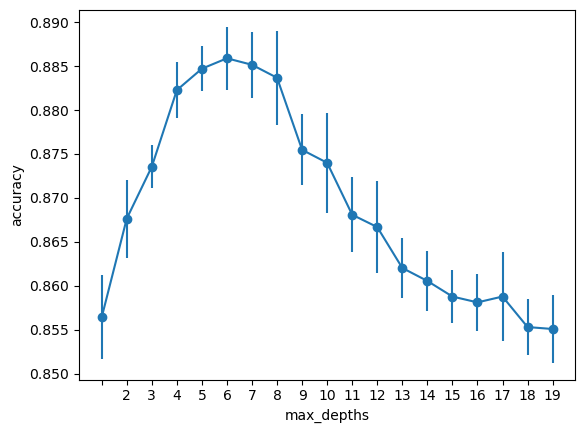

In [81]:
max_depths = [None] + list(np.arange(2, 20))
avg_scores = list()
std_scores = list()

for max_depth in max_depths:
    dt = DecisionTreeClassifier(max_depth=max_depth)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(max_depths)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(max_depths)), max_depths)
plt.xlabel("max_depths")
plt.ylabel("accuracy")
plt.show()

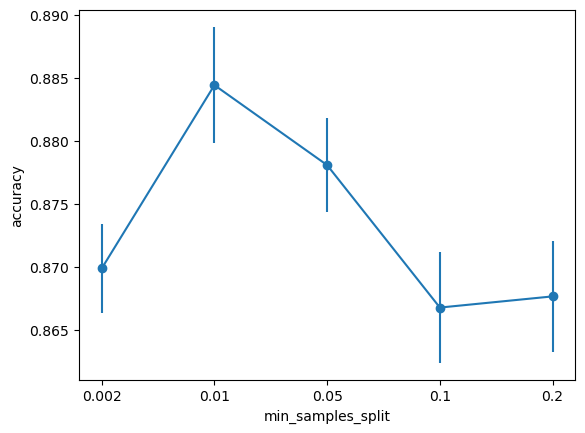

In [82]:
min_samples_splits = [0.002, 0.01, 0.05, 0.1, 0.2]
avg_scores = list()
std_scores = list()

for min_samples_split in min_samples_splits:
    dt = DecisionTreeClassifier(min_samples_split=min_samples_split)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_splits)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_splits)), min_samples_splits)
plt.xlabel("min_samples_split")
plt.ylabel("accuracy")
plt.show()

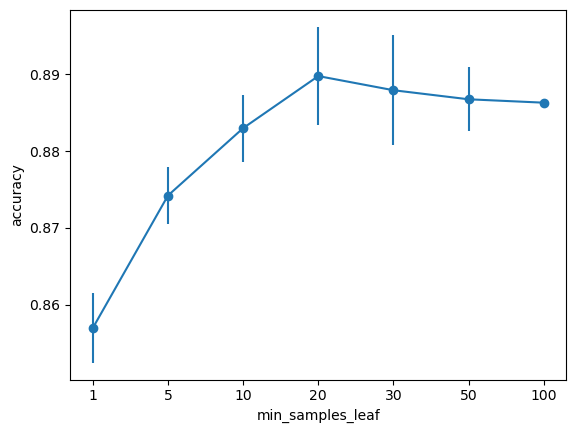

In [83]:
min_samples_leafs = [1, 5, 10, 20, 30, 50, 100]
avg_scores = list()
std_scores = list()

for min_samples_leaf in min_samples_leafs:
    dt = DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_leafs)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_leafs)), min_samples_leafs)
plt.xlabel("min_samples_leaf")
plt.ylabel("accuracy")
plt.show()

In [84]:
dt = DecisionTreeClassifier(min_samples_split=0.01, min_samples_leaf=20, max_depth=6, criterion="gini")

In [85]:
%%time
dt.fit(X_train, y_train)

Wall time: 54.9 ms


DecisionTreeClassifier(max_depth=6, min_samples_leaf=20, min_samples_split=0.01)

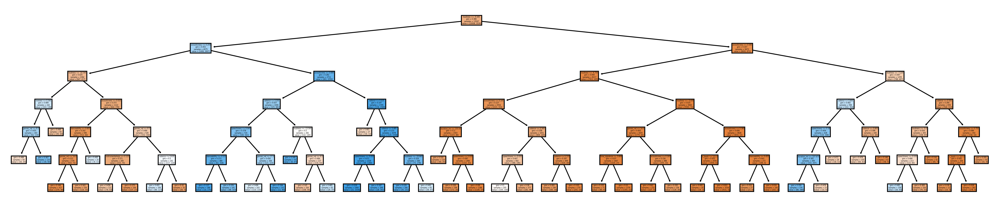

In [86]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dt, feature_names=attributes, filled=True)
plt.show()

In [87]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [88]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8982800620063482
Train F1-score [0.93178218 0.80011604]

Test Accuracy 0.8877052818464269
Test F1-score [0.92372626 0.78721615]


In [89]:
print(classification_report(y_test, y_test_pred))

                  precision    recall  f1-score   support

Molto energetico       0.92      0.93      0.92      3296
 Poco energetico       0.80      0.77      0.79      1210

        accuracy                           0.89      4506
       macro avg       0.86      0.85      0.86      4506
    weighted avg       0.89      0.89      0.89      4506



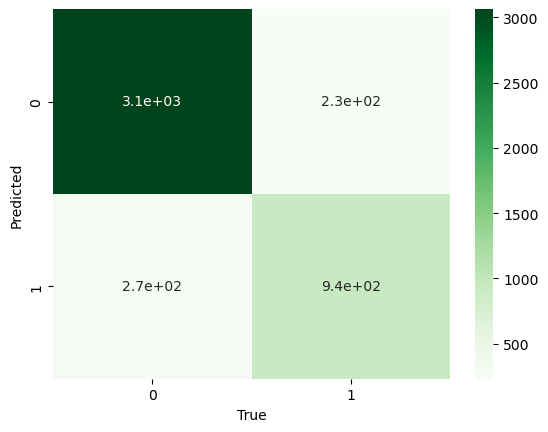

In [90]:
#try sklearn confusion matrix
cf = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cf, annot=True, cmap="Greens")
plt.xlabel("True")
plt.ylabel("Predicted")
plt.show()

In [91]:
zipped = zip(attributes, dt.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

loudness 0.630854161519903
acousticness 0.2687706974253313
valence 0.053626984816282766
genres_val 0.017435218879167293
speechiness 0.016730238138382585
danceability 0.004256803833223987
duration_ms 0.003695061845790913
liveness 0.0026581505685915217
instrumentalness 0.0015574664827113563
n_beats 0.00021617147435773598
time_signature 0.0001990450162575475
key 0.0
mode 0.0
tempo 0.0
n_bars 0.0
processing 0.0
explicit_val 0.0


## #Energy wo

In [92]:
X_train=df_energy_train_wo.drop(["energy_map"], axis=1)
y_train=np.array(df_energy_train_wo['energy_map'])

X_test=df_energy_test_wo.drop(["energy_map"], axis=1)
y_test=np.array(df_energy_test_wo['energy_map'])

attributes = [col for col in df_energy_train_wo.columns if col != 'energy_map']

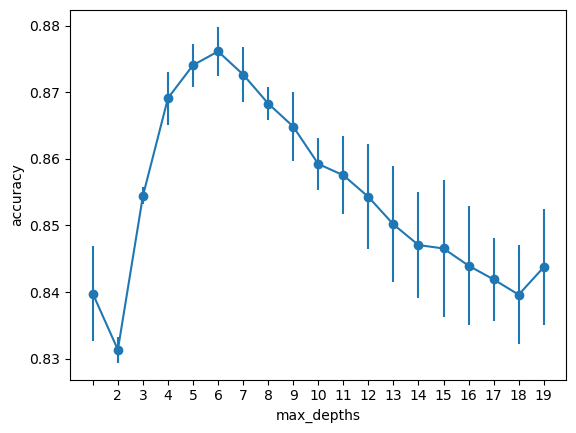

In [93]:
max_depths = [None] + list(np.arange(2, 20))
avg_scores = list()
std_scores = list()

for max_depth in max_depths:
    dt = DecisionTreeClassifier(max_depth=max_depth)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(max_depths)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(max_depths)), max_depths)
plt.xlabel("max_depths")
plt.ylabel("accuracy")
plt.show()

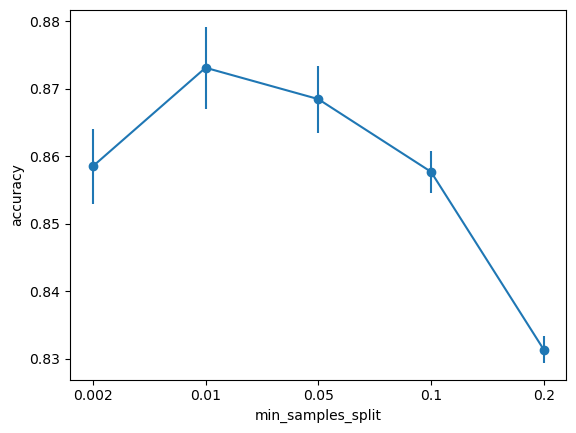

In [94]:
min_samples_splits = [0.002, 0.01, 0.05, 0.1, 0.2]
avg_scores = list()
std_scores = list()

for min_samples_split in min_samples_splits:
    dt = DecisionTreeClassifier(min_samples_split=min_samples_split)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_splits)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_splits)), min_samples_splits)
plt.xlabel("min_samples_split")
plt.ylabel("accuracy")
plt.show()

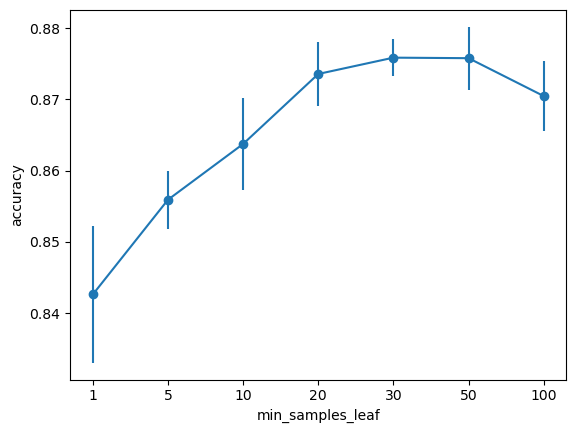

In [95]:
min_samples_leafs = [1, 5, 10, 20, 30, 50, 100]
avg_scores = list()
std_scores = list()

for min_samples_leaf in min_samples_leafs:
    dt = DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_leafs)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_leafs)), min_samples_leafs)
plt.xlabel("min_samples_leaf")
plt.ylabel("accuracy")
plt.show()

In [96]:
dt = DecisionTreeClassifier(min_samples_split=0.01, min_samples_leaf=30, max_depth=6, criterion="gini")

In [97]:
%%time
dt.fit(X_train, y_train)

Wall time: 49.9 ms


DecisionTreeClassifier(max_depth=6, min_samples_leaf=30, min_samples_split=0.01)

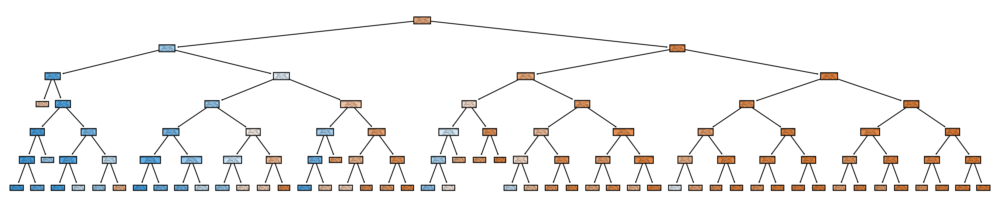

In [98]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dt, feature_names=attributes, filled=True)
plt.show()

In [99]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [100]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.886321694840186
Train F1-score [0.92399566 0.77459016]

Test Accuracy 0.877496671105193
Test F1-score [0.91674208 0.76826196]


In [101]:
print(classification_report(y_test, y_test_pred))

                  precision    recall  f1-score   support

Molto energetico       0.91      0.92      0.92      3296
 Poco energetico       0.78      0.76      0.77      1210

        accuracy                           0.88      4506
       macro avg       0.85      0.84      0.84      4506
    weighted avg       0.88      0.88      0.88      4506



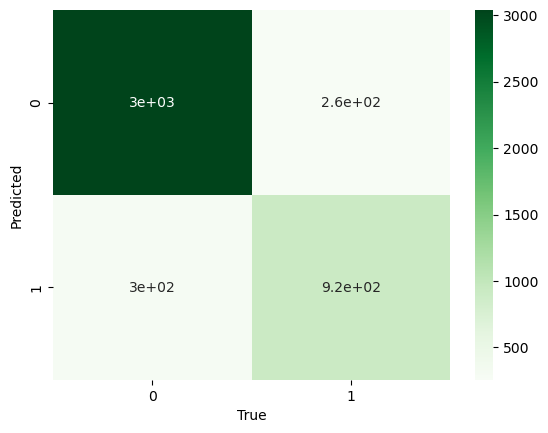

In [102]:
#try sklearn confusion matrix
cf = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cf, annot=True, cmap="Greens")
plt.xlabel("True")
plt.ylabel("Predicted")
plt.show()

In [103]:
zipped = zip(attributes, dt.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

loudness 0.744030738577447
valence 0.08632851864309503
n_beats 0.06548262528000691
instrumentalness 0.04627473730635536
speechiness 0.04510723108673704
duration_ms 0.00608715246395493
liveness 0.004325467976894699
n_bars 0.0023635286655091007
key 0.0
mode 0.0
tempo 0.0
time_signature 0.0
processing 0.0
explicit_val 0.0


##  #Danceability full

In [104]:
X_train=df_danceability_train.drop(["danceability_map"], axis=1)
y_train=np.array(df_danceability_train['danceability_map'])

X_test=df_danceability_test.drop(["danceability_map"], axis=1)
y_test=np.array(df_danceability_test['danceability_map'])

attributes = [col for col in df_danceability_train.columns if col != 'danceability_map']

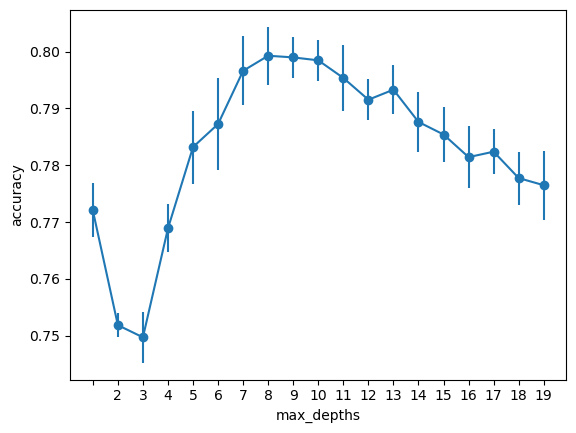

In [105]:
max_depths = [None] + list(np.arange(2, 20))
avg_scores = list()
std_scores = list()

for max_depth in max_depths:
    dt = DecisionTreeClassifier(max_depth=max_depth)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(max_depths)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(max_depths)), max_depths)
plt.xlabel("max_depths")
plt.ylabel("accuracy")
plt.show()

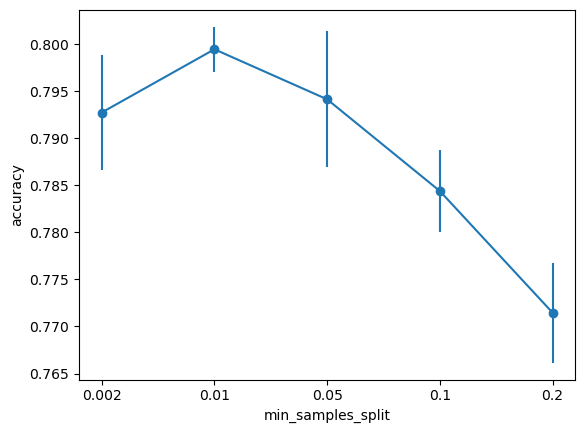

In [106]:
min_samples_splits = [0.002, 0.01, 0.05, 0.1, 0.2]
avg_scores = list()
std_scores = list()

for min_samples_split in min_samples_splits:
    dt = DecisionTreeClassifier(min_samples_split=min_samples_split)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_splits)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_splits)), min_samples_splits)
plt.xlabel("min_samples_split")
plt.ylabel("accuracy")
plt.show()

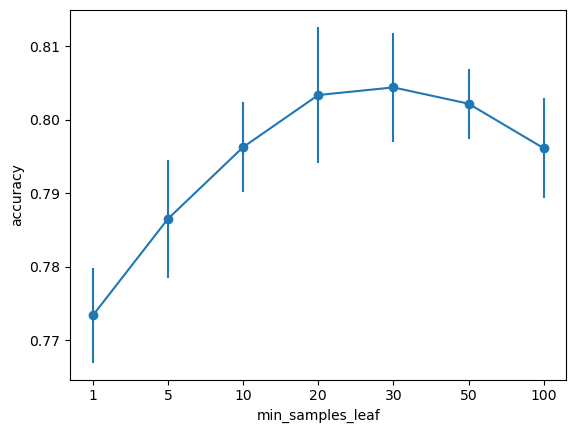

In [107]:
min_samples_leafs = [1, 5, 10, 20, 30, 50, 100]
avg_scores = list()
std_scores = list()

for min_samples_leaf in min_samples_leafs:
    dt = DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_leafs)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_leafs)), min_samples_leafs)
plt.xlabel("min_samples_leaf")
plt.ylabel("accuracy")
plt.show()

In [108]:
dt = DecisionTreeClassifier(min_samples_split=0.01, min_samples_leaf=30, max_depth=8, criterion="gini")

In [109]:
%%time
dt.fit(X_train, y_train)

Wall time: 73.3 ms


DecisionTreeClassifier(max_depth=8, min_samples_leaf=30, min_samples_split=0.01)

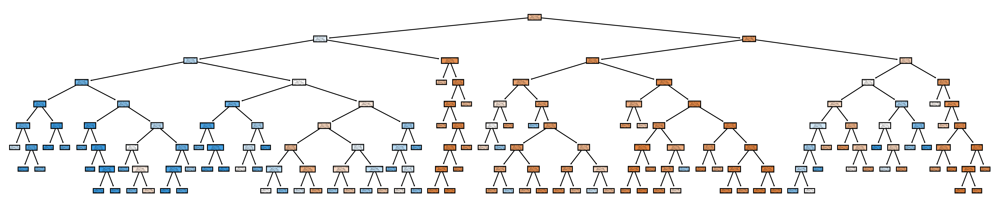

In [110]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dt, feature_names=attributes, filled=True)
plt.show()

In [111]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [112]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8219531999704731
Train F1-score [0.87601522 0.68429319]

Test Accuracy 0.796271637816245
Test F1-score [0.85771854 0.64140625]


In [113]:
print(classification_report(y_test, y_test_pred))

                 precision    recall  f1-score   support

Molto danzabile       0.81      0.91      0.86      3039
 Poco danzabile       0.75      0.56      0.64      1467

       accuracy                           0.80      4506
      macro avg       0.78      0.74      0.75      4506
   weighted avg       0.79      0.80      0.79      4506



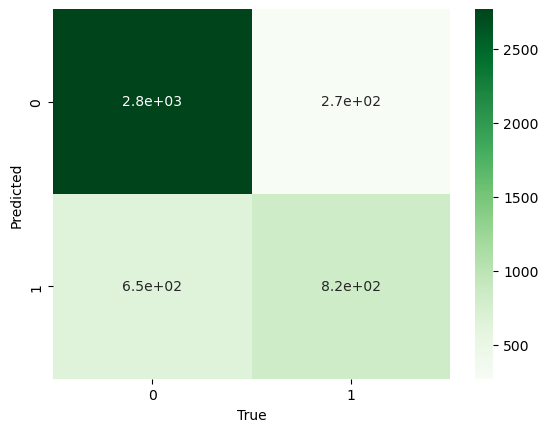

In [114]:
#try sklearn confusion matrix
cf = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cf, annot=True, cmap="Greens")
plt.xlabel("True")
plt.ylabel("Predicted")
plt.show()

In [115]:
zipped = zip(attributes, dt.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

valence 0.46395928406840614
genres_val 0.2411948129906616
tempo 0.12002588706219326
acousticness 0.03315423796710167
time_signature 0.02899690336930705
energy 0.027057047799555117
instrumentalness 0.026686599205680686
loudness 0.015618808913780575
n_beats 0.013448199884124035
speechiness 0.013039516360415835
liveness 0.009763215297617811
duration_ms 0.005279164445591438
n_bars 0.001705978276595215
processing 7.034435896960684e-05
key 0.0
mode 0.0
explicit_val 0.0


## #Danceability wo

In [116]:
X_train=df_danceability_train_wo.drop(["danceability_map"], axis=1)
y_train=np.array(df_danceability_train_wo['danceability_map'])

X_test=df_danceability_test_wo.drop(["danceability_map"], axis=1)
y_test=np.array(df_danceability_test_wo['danceability_map'])

attributes = [col for col in df_danceability_train_wo.columns if col != 'danceability_map']

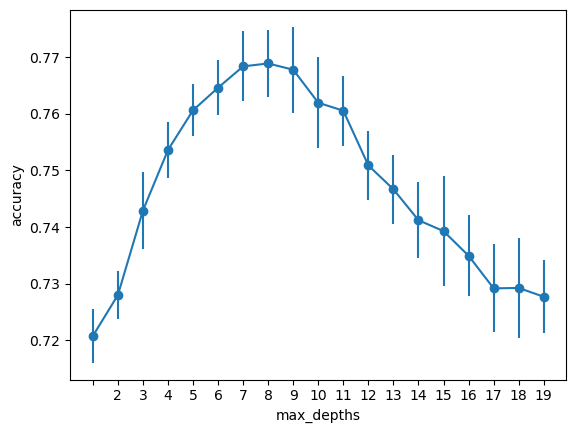

In [117]:
max_depths = [None] + list(np.arange(2, 20))
avg_scores = list()
std_scores = list()

for max_depth in max_depths:
    dt = DecisionTreeClassifier(max_depth=max_depth)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(max_depths)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(max_depths)), max_depths)
plt.xlabel("max_depths")
plt.ylabel("accuracy")
plt.show()

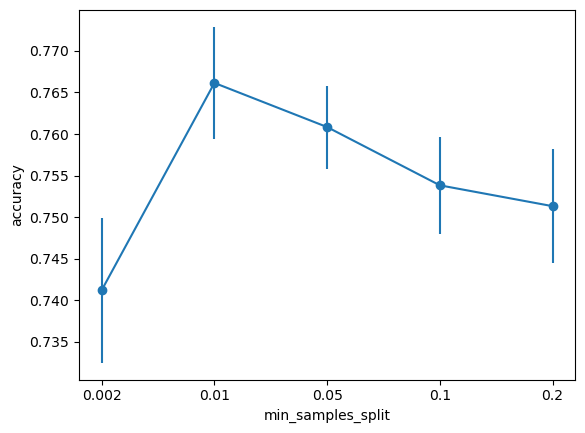

In [118]:
min_samples_splits = [0.002, 0.01, 0.05, 0.1, 0.2]
avg_scores = list()
std_scores = list()

for min_samples_split in min_samples_splits:
    dt = DecisionTreeClassifier(min_samples_split=min_samples_split)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_splits)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_splits)), min_samples_splits)
plt.xlabel("min_samples_split")
plt.ylabel("accuracy")
plt.show()

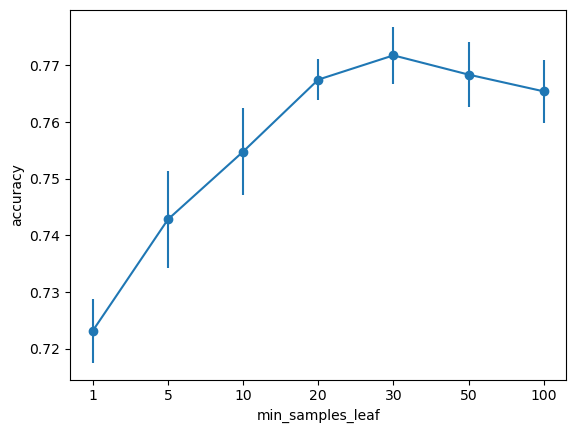

In [119]:
min_samples_leafs = [1, 5, 10, 20, 30, 50, 100]
avg_scores = list()
std_scores = list()

for min_samples_leaf in min_samples_leafs:
    dt = DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_leafs)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_leafs)), min_samples_leafs)
plt.xlabel("min_samples_leaf")
plt.ylabel("accuracy")
plt.show()

In [120]:
dt = DecisionTreeClassifier(min_samples_split=0.01, min_samples_leaf=30, max_depth=8, criterion="gini")

In [121]:
%%time
dt.fit(X_train, y_train)

Wall time: 59.4 ms


DecisionTreeClassifier(max_depth=8, min_samples_leaf=30, min_samples_split=0.01)

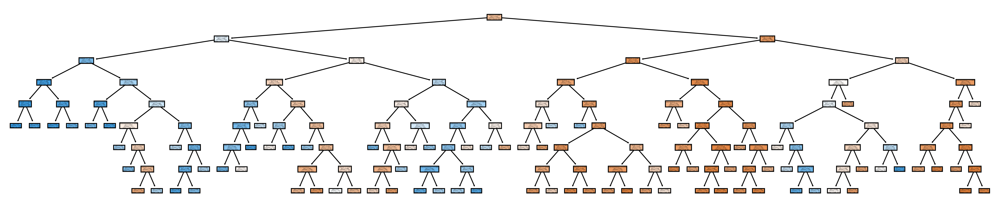

In [122]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dt, feature_names=attributes, filled=True)
plt.show()

In [123]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [124]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.7920572820550675
Train F1-score [0.85394307 0.63916998]

Test Accuracy 0.7769640479360852
Test F1-score [0.84299328 0.61509   ]


In [125]:
print(classification_report(y_test, y_test_pred))

                 precision    recall  f1-score   support

Molto danzabile       0.80      0.89      0.84      3039
 Poco danzabile       0.70      0.55      0.62      1467

       accuracy                           0.78      4506
      macro avg       0.75      0.72      0.73      4506
   weighted avg       0.77      0.78      0.77      4506



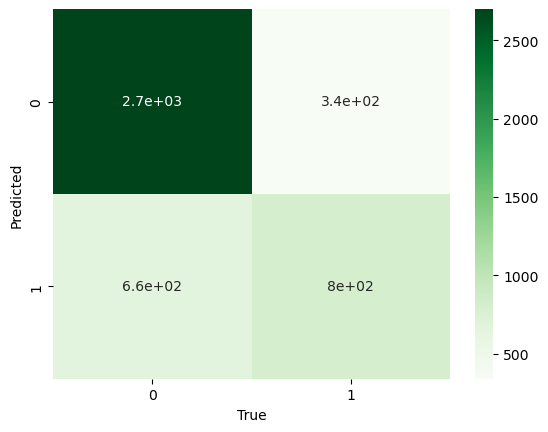

In [126]:
#try sklearn confusion matrix
cf = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cf, annot=True, cmap="Greens")
plt.xlabel("True")
plt.ylabel("Predicted")
plt.show()

In [127]:
zipped = zip(attributes, dt.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

valence 0.5766619571128548
tempo 0.17577341993236598
time_signature 0.0689362082039486
loudness 0.06254703739136835
instrumentalness 0.03829088238549552
liveness 0.0289020307037501
speechiness 0.019808291779942453
n_bars 0.017189762093369868
duration_ms 0.0066111701341179975
n_beats 0.0052792402627864655
key 0.0
mode 0.0
processing 0.0
explicit_val 0.0


## #Acousticness full

In [128]:
X_train=df_acousticness_train.drop(["acousticness_map"], axis=1)
y_train=np.array(df_acousticness_train['acousticness_map'])

X_test=df_acousticness_test.drop(["acousticness_map"], axis=1)
y_test=np.array(df_acousticness_test['acousticness_map'])

attributes = [col for col in df_acousticness_train.columns if col != 'acousticness_map']

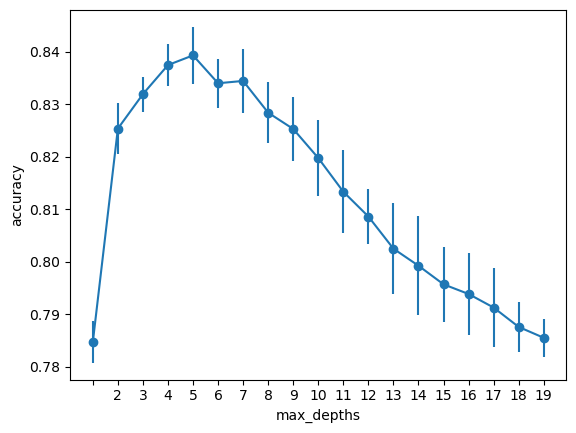

In [129]:
max_depths = [None] + list(np.arange(2, 20))
avg_scores = list()
std_scores = list()

for max_depth in max_depths:
    dt = DecisionTreeClassifier(max_depth=max_depth)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(max_depths)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(max_depths)), max_depths)
plt.xlabel("max_depths")
plt.ylabel("accuracy")
plt.show()

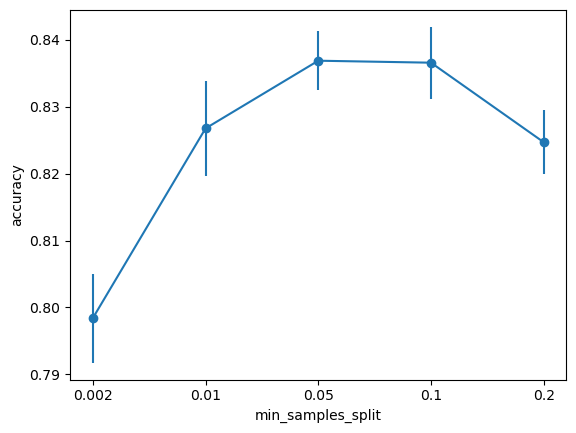

In [130]:
min_samples_splits = [0.002, 0.01, 0.05, 0.1, 0.2]
avg_scores = list()
std_scores = list()

for min_samples_split in min_samples_splits:
    dt = DecisionTreeClassifier(min_samples_split=min_samples_split)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_splits)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_splits)), min_samples_splits)
plt.xlabel("min_samples_split")
plt.ylabel("accuracy")
plt.show()

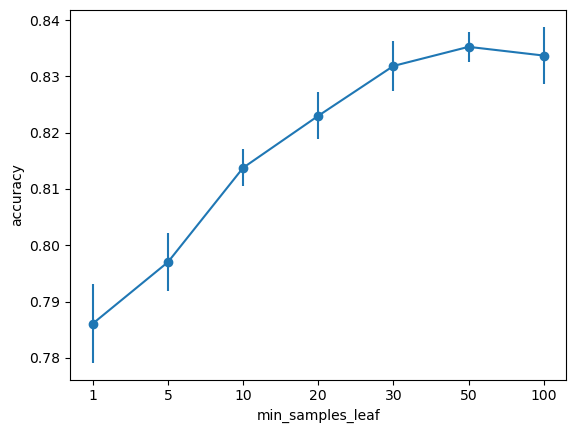

In [131]:
min_samples_leafs = [1, 5, 10, 20, 30, 50, 100]
avg_scores = list()
std_scores = list()

for min_samples_leaf in min_samples_leafs:
    dt = DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_leafs)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_leafs)), min_samples_leafs)
plt.xlabel("min_samples_leaf")
plt.ylabel("accuracy")
plt.show()

In [132]:
dt = DecisionTreeClassifier(min_samples_split=0.05, min_samples_leaf=50, max_depth=5, criterion="gini")

In [133]:
%%time
dt.fit(X_train, y_train)

Wall time: 56.9 ms


DecisionTreeClassifier(max_depth=5, min_samples_leaf=50, min_samples_split=0.05)

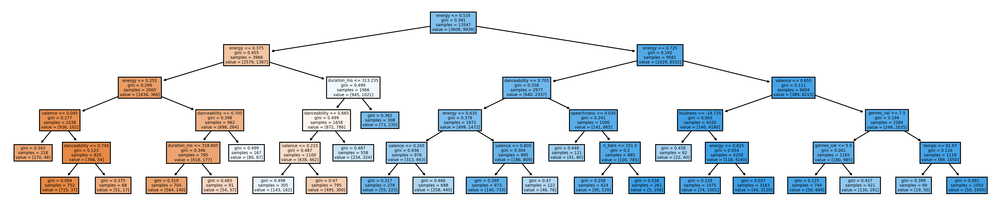

In [134]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dt, feature_names=attributes, filled=True)
plt.show()

In [135]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [136]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8421790802391673
Train F1-score [0.65715202 0.89749736]

Test Accuracy 0.8371060807811807
Test F1-score [0.66018519 0.89287799]


In [137]:
print(classification_report(y_test, y_test_pred))

                precision    recall  f1-score   support

Molto acustico       0.78      0.57      0.66      1247
 Poco acustico       0.85      0.94      0.89      3259

      accuracy                           0.84      4506
     macro avg       0.82      0.76      0.78      4506
  weighted avg       0.83      0.84      0.83      4506



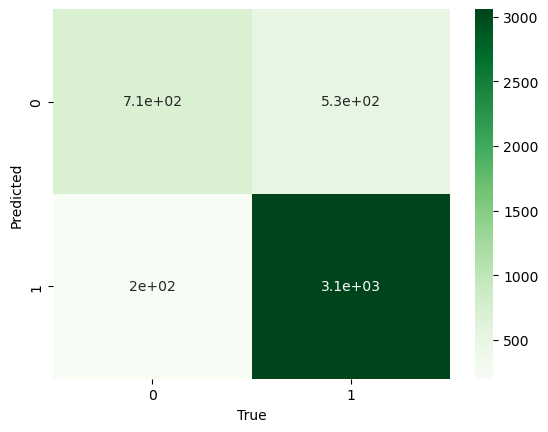

In [138]:
#try sklearn confusion matrix
cf = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cf, annot=True, cmap="Greens")
plt.xlabel("True")
plt.ylabel("Predicted")
plt.show()

In [139]:
zipped = zip(attributes, dt.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

energy 0.8894719939728655
danceability 0.02877811398622899
valence 0.025380404543930618
duration_ms 0.022036861111008433
genres_val 0.018053098573226043
loudness 0.005727744511280073
speechiness 0.004755596794311412
tempo 0.002941296973085462
n_bars 0.002854889534063456
key 0.0
mode 0.0
instrumentalness 0.0
liveness 0.0
time_signature 0.0
n_beats 0.0
processing 0.0
explicit_val 0.0


## #Acousticness wo

In [140]:
X_train=df_acousticness_train_wo.drop(["acousticness_map"], axis=1)
y_train=np.array(df_acousticness_train_wo['acousticness_map'])

X_test=df_acousticness_test_wo.drop(["acousticness_map"], axis=1)
y_test=np.array(df_acousticness_test_wo['acousticness_map'])

attributes = [col for col in df_acousticness_train_wo.columns if col != 'acousticness_map']

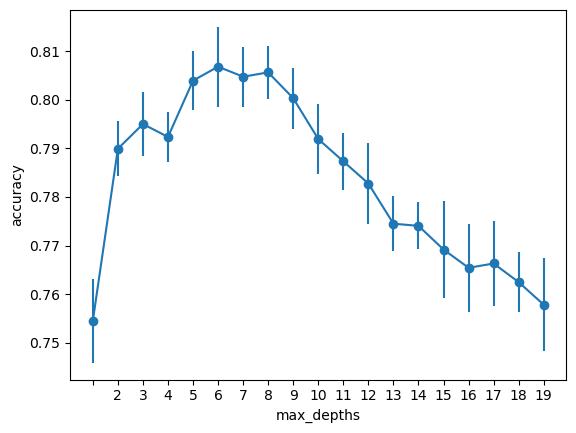

In [141]:
max_depths = [None] + list(np.arange(2, 20))
avg_scores = list()
std_scores = list()

for max_depth in max_depths:
    dt = DecisionTreeClassifier(max_depth=max_depth)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(max_depths)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(max_depths)), max_depths)
plt.xlabel("max_depths")
plt.ylabel("accuracy")
plt.show()

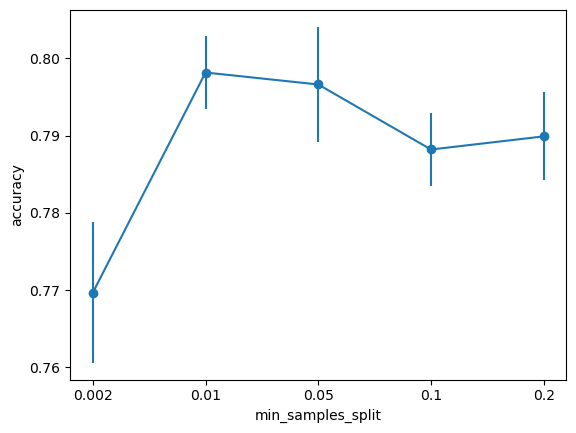

In [142]:
min_samples_splits = [0.002, 0.01, 0.05, 0.1, 0.2]
avg_scores = list()
std_scores = list()

for min_samples_split in min_samples_splits:
    dt = DecisionTreeClassifier(min_samples_split=min_samples_split)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_splits)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_splits)), min_samples_splits)
plt.xlabel("min_samples_split")
plt.ylabel("accuracy")
plt.show()

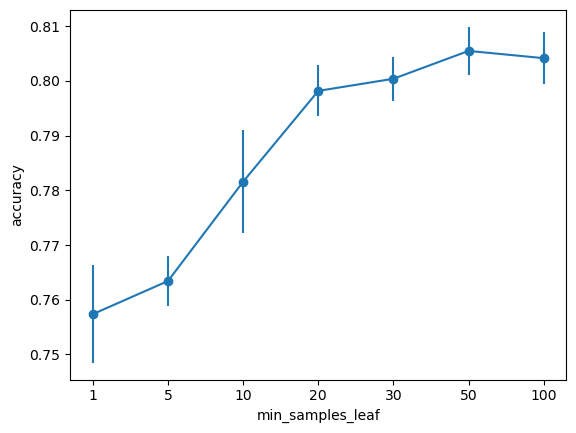

In [143]:
min_samples_leafs = [1, 5, 10, 20, 30, 50, 100]
avg_scores = list()
std_scores = list()

for min_samples_leaf in min_samples_leafs:
    dt = DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_leafs)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_leafs)), min_samples_leafs)
plt.xlabel("min_samples_leaf")
plt.ylabel("accuracy")
plt.show()

In [144]:
dt = DecisionTreeClassifier(min_samples_split=0.01, min_samples_leaf=50, max_depth=6, criterion="gini")

In [145]:
%%time
dt.fit(X_train, y_train)

Wall time: 50.9 ms


DecisionTreeClassifier(max_depth=6, min_samples_leaf=50, min_samples_split=0.01)

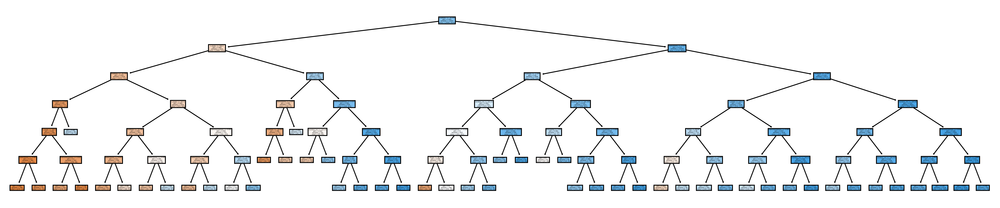

In [146]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dt, feature_names=attributes, filled=True)
plt.show()

In [147]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [148]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8167121872001181
Train F1-score [0.584296   0.88243928]

Test Accuracy 0.8167121872001181
Test F1-score [0.584296   0.88243928]


In [149]:
print(classification_report(y_test, y_test_pred))

                precision    recall  f1-score   support

Molto acustico       0.74      0.48      0.58      3608
 Poco acustico       0.83      0.94      0.88      9939

      accuracy                           0.82     13547
     macro avg       0.79      0.71      0.73     13547
  weighted avg       0.81      0.82      0.80     13547



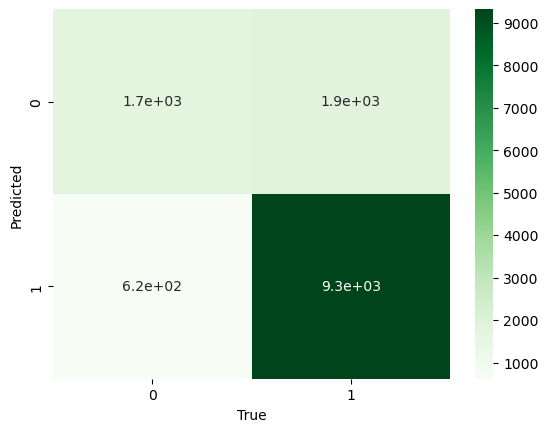

In [150]:
#try sklearn confusion matrix
cf = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cf, annot=True, cmap="Greens")
plt.xlabel("True")
plt.ylabel("Predicted")
plt.show()

In [151]:
zipped = zip(attributes, dt.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

loudness 0.6120247711907875
n_beats 0.11384630216651115
speechiness 0.11184769291089018
instrumentalness 0.08570134519666908
duration_ms 0.03624705386521881
liveness 0.021896076497204438
tempo 0.013713624208456222
processing 0.002531079460683242
key 0.001229136002746055
valence 0.0009629185008332085
mode 0.0
time_signature 0.0
n_bars 0.0
explicit_val 0.0


# Randomized search

## #Energy full

In [152]:
X_train=df_energy_train.drop(["energy_map"], axis=1)
y_train=np.array(df_energy_train['energy_map'])

X_test=df_energy_test.drop(["energy_map"], axis=1)
y_test=np.array(df_energy_test['energy_map'])

attributes = [col for col in df_energy_train.columns if col != 'energy_map']

In [153]:
%%time
param_list = {
    'max_depth': [None] + list(np.arange(2, 20)),
    'min_samples_split': [2, 5, 10, 20, 30, 50, 100],
    'min_samples_leaf': [1, 5, 10, 20, 30, 50, 100],
    'criterion': ['gini', 'entropy']
}

clf = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)

random_search = RandomizedSearchCV(
    DecisionTreeClassifier(),
    param_distributions=param_list,
    cv=RepeatedStratifiedKFold(random_state=0),
    n_jobs=-1,
    refit=True,
    n_iter=200,
    #verbose=2
)

random_search.fit(X_train, y_train)
clf = random_search.best_estimator_

Wall time: 1min 33s


In [154]:
print(random_search.best_params_, random_search.best_score_)

{'min_samples_split': 5, 'min_samples_leaf': 30, 'max_depth': 13, 'criterion': 'gini'} 0.8897467019188464


In [158]:
y_test_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_test_pred))

Accuracy: 0.8994673768308922


In [159]:
clf.score(X_test, y_test)

0.8994673768308922

In [160]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.0
Train F1-score [0. 0. 0. 0.]

Test Accuracy 0.8994673768308922
Test F1-score [0.93213483 0.80616175]


In [161]:
print(classification_report(y_test, y_test_pred))

                  precision    recall  f1-score   support

Molto energetico       0.92      0.94      0.93      3296
 Poco energetico       0.84      0.78      0.81      1210

        accuracy                           0.90      4506
       macro avg       0.88      0.86      0.87      4506
    weighted avg       0.90      0.90      0.90      4506



In [162]:
results = pd.DataFrame(random_search.cv_results_)

<AxesSubplot:xlabel='param_max_depth', ylabel='mean_test_score'>

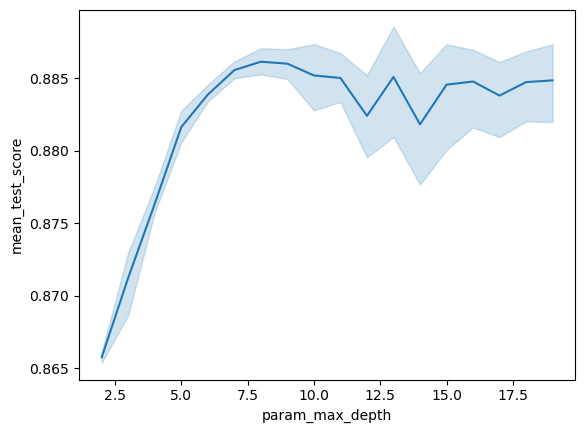

In [163]:
sns.lineplot(data=results, x="param_max_depth", y="mean_test_score")

<AxesSubplot:xlabel='param_min_samples_leaf', ylabel='mean_test_score'>

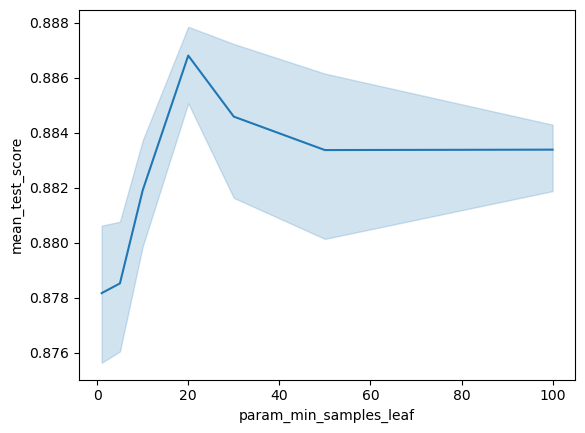

In [164]:
sns.lineplot(data=results, x="param_min_samples_leaf", y="mean_test_score")

In [165]:
zipped = zip(attributes, clf.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

loudness 0.5958140901386658
acousticness 0.25773346786964124
valence 0.05508671187997038
genres_val 0.02489782968526887
speechiness 0.01781155818283755
duration_ms 0.011279042159325514
n_beats 0.009934981086533505
tempo 0.007047782995484472
liveness 0.00542783269597098
instrumentalness 0.005295677458728751
danceability 0.004704640476520042
n_bars 0.0017391764260569354
processing 0.001483644977624207
key 0.001425704427060594
time_signature 0.00027161110560044196
explicit_val 4.6248434710741316e-05
mode 0.0


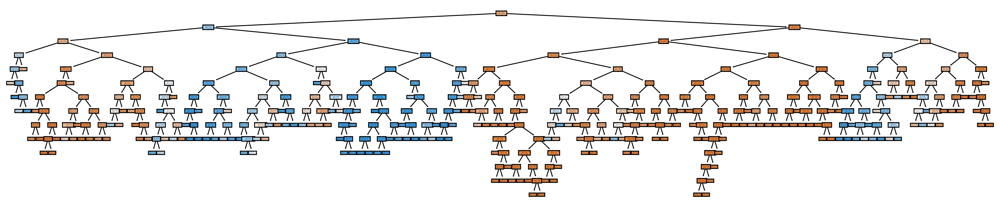

In [166]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(clf, feature_names=attributes, filled=True)
plt.show()

## #Energy wo

In [167]:
X_train=df_energy_train_wo.drop(["energy_map"], axis=1)
y_train=np.array(df_energy_train_wo['energy_map'])

X_test=df_energy_test_wo.drop(["energy_map"], axis=1)
y_test=np.array(df_energy_test_wo['energy_map'])

attributes = [col for col in df_energy_train_wo.columns if col != 'energy_map']

In [168]:
%%time
param_list = {
    'max_depth': [None] + list(np.arange(2, 20)),
    'min_samples_split': [2, 5, 10, 20, 30, 50, 100],
    'min_samples_leaf': [1, 5, 10, 20, 30, 50, 100],
    'criterion': ['gini', 'entropy']
}

clf = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)

random_search = RandomizedSearchCV(
    DecisionTreeClassifier(),
    param_distributions=param_list,
    cv=RepeatedStratifiedKFold(random_state=0),
    n_jobs=-1,
    refit=True,
    n_iter=200,
    #verbose=2
)

random_search.fit(X_train, y_train)
clf = random_search.best_estimator_

C:\Users\Noemi\anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Wall time: 1min 27s


In [169]:
print(random_search.best_params_, random_search.best_score_)

{'min_samples_split': 20, 'min_samples_leaf': 50, 'max_depth': 8, 'criterion': 'gini'} 0.8766074762408753


In [170]:
y_test_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_test_pred))

Accuracy: 0.8728362183754993


In [171]:
clf.score(X_test, y_test)

0.8728362183754993

In [172]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.0
Train F1-score [0. 0. 0. 0.]

Test Accuracy 0.8728362183754993
Test F1-score [0.91395104 0.75648109]


In [173]:
print(classification_report(y_test, y_test_pred))

                  precision    recall  f1-score   support

Molto energetico       0.90      0.92      0.91      3296
 Poco energetico       0.78      0.74      0.76      1210

        accuracy                           0.87      4506
       macro avg       0.84      0.83      0.84      4506
    weighted avg       0.87      0.87      0.87      4506



In [174]:
results = pd.DataFrame(random_search.cv_results_)

<AxesSubplot:xlabel='param_max_depth', ylabel='mean_test_score'>

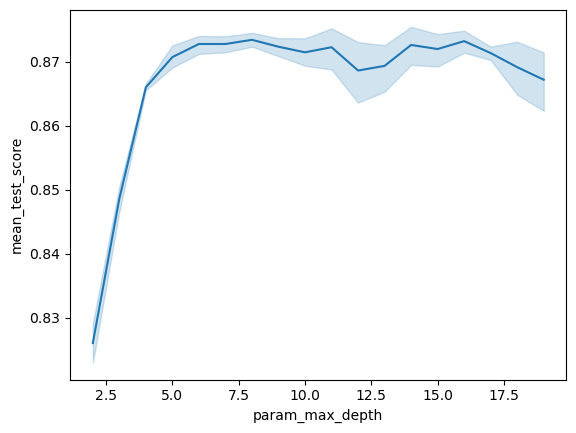

In [175]:
sns.lineplot(data=results, x="param_max_depth", y="mean_test_score")

<AxesSubplot:xlabel='param_min_samples_leaf', ylabel='mean_test_score'>

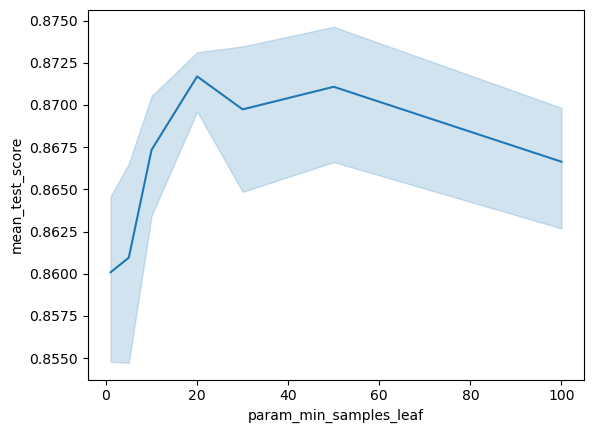

In [176]:
sns.lineplot(data=results, x="param_min_samples_leaf", y="mean_test_score")

In [177]:
zipped = zip(attributes, clf.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

loudness 0.7193400505378168
valence 0.08183617218455431
n_beats 0.06697448221838702
speechiness 0.049880360338169775
instrumentalness 0.04938942100280765
duration_ms 0.016832740691191044
liveness 0.0076212602591982335
tempo 0.003806491728813225
n_bars 0.0022508492880004456
processing 0.0010754826442015732
key 0.0007245079516068509
time_signature 0.00026818115525304397
mode 0.0
explicit_val 0.0


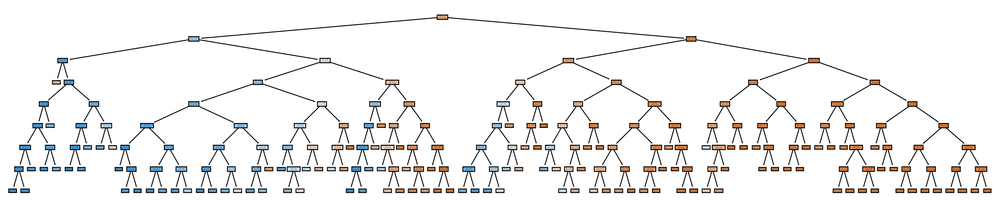

In [178]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(clf, feature_names=attributes, filled=True)
plt.show()

## #Danceability full

In [179]:
X_train=df_danceability_train.drop(["danceability_map"], axis=1)
y_train=np.array(df_danceability_train['danceability_map'])

X_test=df_danceability_test.drop(["danceability_map"], axis=1)
y_test=np.array(df_danceability_test['danceability_map'])

attributes = [col for col in df_danceability_train.columns if col != 'danceability_map']

In [180]:
%%time
param_list = {
    'max_depth': [None] + list(np.arange(2, 20)),
    'min_samples_split': [2, 5, 10, 20, 30, 50, 100],
    'min_samples_leaf': [1, 5, 10, 20, 30, 50, 100],
    'criterion': ['gini', 'entropy']
}

clf = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)

random_search = RandomizedSearchCV(
    DecisionTreeClassifier(),
    param_distributions=param_list,
    cv=RepeatedStratifiedKFold(random_state=0),
    n_jobs=-1,
    refit=True,
    n_iter=200,
    #verbose=2
)

random_search.fit(X_train, y_train)
clf = random_search.best_estimator_

Wall time: 1min 59s


In [40]:
print(random_search.best_params_, random_search.best_score_)

{'min_samples_split': 5, 'min_samples_leaf': 50, 'max_depth': 12, 'criterion': 'gini'} 0.8877241880917904


In [181]:
y_test_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_test_pred))

Accuracy: 0.7991566799822459


In [182]:
clf.score(X_test, y_test)

0.7991566799822459

In [183]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.0
Train F1-score [0. 0. 0. 0.]

Test Accuracy 0.7991566799822459
Test F1-score [0.85609795 0.66764598]


In [184]:
print(classification_report(y_test, y_test_pred))

                 precision    recall  f1-score   support

Molto danzabile       0.83      0.89      0.86      3039
 Poco danzabile       0.72      0.62      0.67      1467

       accuracy                           0.80      4506
      macro avg       0.78      0.75      0.76      4506
   weighted avg       0.79      0.80      0.79      4506



In [185]:
results = pd.DataFrame(random_search.cv_results_)

<AxesSubplot:xlabel='param_max_depth', ylabel='mean_test_score'>

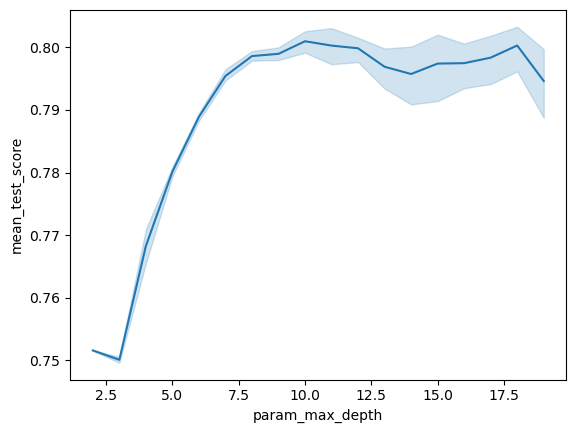

In [186]:
sns.lineplot(data=results, x="param_max_depth", y="mean_test_score")

<AxesSubplot:xlabel='param_min_samples_leaf', ylabel='mean_test_score'>

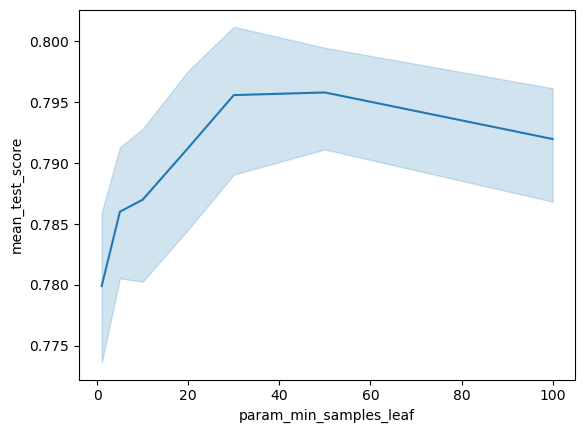

In [187]:
sns.lineplot(data=results, x="param_min_samples_leaf", y="mean_test_score")

In [188]:
zipped = zip(attributes, clf.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

valence 0.4032514351863843
genres_val 0.22894450104579583
tempo 0.12246848688026932
acousticness 0.04510239095949218
energy 0.03925634295010356
instrumentalness 0.03377617564401131
time_signature 0.02698312406885694
loudness 0.022906973756662383
n_beats 0.019174021298235106
liveness 0.01778438170834728
speechiness 0.016583440732170284
duration_ms 0.013092990112546273
n_bars 0.006737027365445426
processing 0.0024392131078970975
key 0.001287700014857678
mode 0.00021179516892494654
explicit_val 0.0


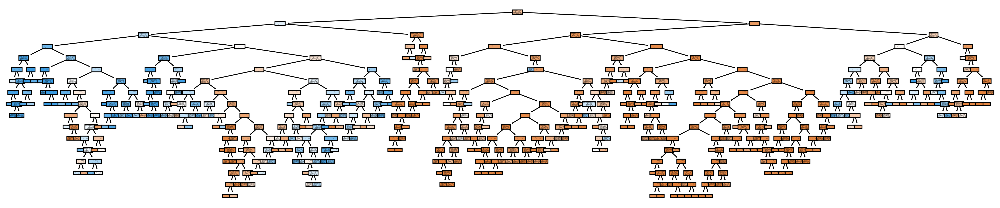

In [189]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(clf, feature_names=attributes, filled=True)
plt.show()

## #Danceability wo

In [202]:
X_train=df_danceability_train_wo.drop(["danceability_map"], axis=1)
y_train=np.array(df_danceability_train_wo['danceability_map'])

X_test=df_danceability_test_wo.drop(["danceability_map"], axis=1)
y_test=np.array(df_danceability_test_wo['danceability_map'])

attributes = [col for col in df_danceability_train_wo.columns if col != 'danceability_map']

In [203]:
%%time
param_list = {
    'max_depth': [None] + list(np.arange(2, 20)),
    'min_samples_split': [2, 5, 10, 20, 30, 50, 100],
    'min_samples_leaf': [1, 5, 10, 20, 30, 50, 100],
    'criterion': ['gini', 'entropy']
}

clf = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)

random_search = RandomizedSearchCV(
    DecisionTreeClassifier(),
    param_distributions=param_list,
    cv=RepeatedStratifiedKFold(random_state=0),
    n_jobs=-1,
    refit=True,
    n_iter=200,
    #verbose=2
)

random_search.fit(X_train, y_train)
clf = random_search.best_estimator_

Wall time: 1min 44s


In [204]:
print(random_search.best_params_, random_search.best_score_)

{'min_samples_split': 100, 'min_samples_leaf': 20, 'max_depth': 9, 'criterion': 'gini'} 0.7707909837237907


In [205]:
y_test_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_test_pred))

Accuracy: 0.7789613848202397


In [206]:
clf.score(X_test, y_test)

0.7789613848202397

In [207]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.0
Train F1-score [0. 0. 0. 0.]

Test Accuracy 0.7789613848202397
Test F1-score [0.84686347 0.60287081]


In [208]:
print(classification_report(y_test, y_test_pred))

                 precision    recall  f1-score   support

Molto danzabile       0.79      0.91      0.85      3039
 Poco danzabile       0.73      0.52      0.60      1467

       accuracy                           0.78      4506
      macro avg       0.76      0.71      0.72      4506
   weighted avg       0.77      0.78      0.77      4506



In [209]:
results = pd.DataFrame(random_search.cv_results_)

<AxesSubplot:xlabel='param_max_depth', ylabel='mean_test_score'>

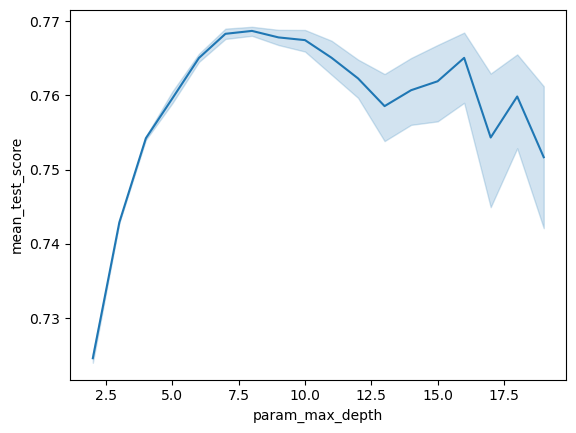

In [210]:
sns.lineplot(data=results, x="param_max_depth", y="mean_test_score")

<AxesSubplot:xlabel='param_min_samples_leaf', ylabel='mean_test_score'>

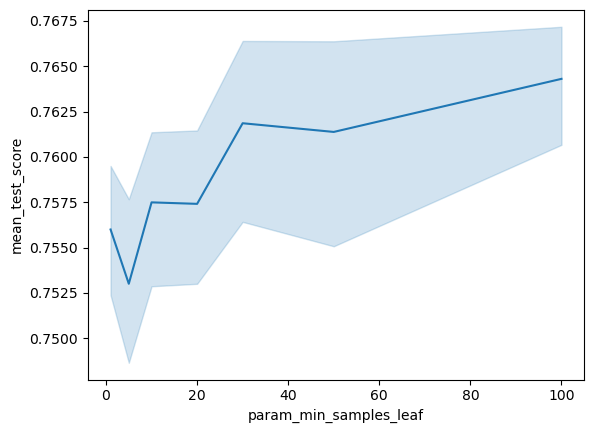

In [211]:
sns.lineplot(data=results, x="param_min_samples_leaf", y="mean_test_score")

In [212]:
zipped = zip(attributes, clf.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

valence 0.5429234041096208
tempo 0.17733866818819138
loudness 0.06499848277984323
time_signature 0.0645816259152852
instrumentalness 0.039295446925913274
liveness 0.03865428953596881
speechiness 0.024327466973099853
n_bars 0.015595848964699885
n_beats 0.015496158389869659
duration_ms 0.013285549599743013
key 0.001895513624588184
mode 0.001607544993176776
processing 0.0
explicit_val 0.0


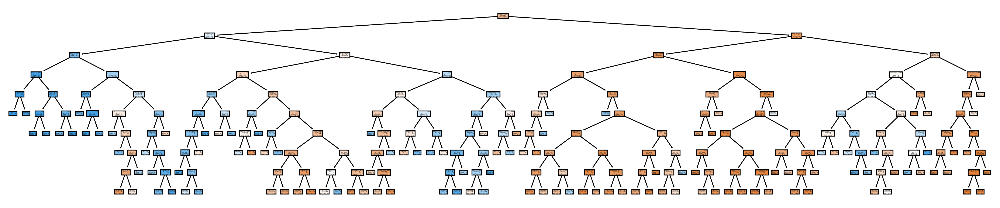

In [213]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(clf, feature_names=attributes, filled=True)
plt.show()

## #Acousticness full

In [214]:
X_train=df_acousticness_train.drop(["acousticness_map"], axis=1)
y_train=np.array(df_acousticness_train['acousticness_map'])

X_test=df_acousticness_test.drop(["acousticness_map"], axis=1)
y_test=np.array(df_acousticness_test['acousticness_map'])

attributes = [col for col in df_acousticness_train.columns if col != 'acousticness_map']

In [215]:
%%time
param_list = {
    'max_depth': [None] + list(np.arange(2, 20)),
    'min_samples_split': [2, 5, 10, 20, 30, 50, 100],
    'min_samples_leaf': [1, 5, 10, 20, 30, 50, 100],
    'criterion': ['gini', 'entropy']
}

clf = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)

random_search = RandomizedSearchCV(
    DecisionTreeClassifier(),
    param_distributions=param_list,
    cv=RepeatedStratifiedKFold(random_state=0),
    n_jobs=-1,
    refit=True,
    n_iter=200,
    #verbose=2
)

random_search.fit(X_train, y_train)
clf = random_search.best_estimator_

Wall time: 1min 39s


In [216]:
print(random_search.best_params_, random_search.best_score_)

{'min_samples_split': 20, 'min_samples_leaf': 5, 'max_depth': 5, 'criterion': 'gini'} 0.8382665843934188


In [217]:
y_test_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_test_pred))

Accuracy: 0.8402130492676432


In [218]:
clf.score(X_test, y_test)

0.8402130492676432

In [219]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8167121872001181
Train F1-score [0.584296   0.88243928]

Test Accuracy 0.8402130492676432
Test F1-score [0.67799642 0.89374262]


In [220]:
print(classification_report(y_test, y_test_pred))

                precision    recall  f1-score   support

Molto acustico       0.77      0.61      0.68      1247
 Poco acustico       0.86      0.93      0.89      3259

      accuracy                           0.84      4506
     macro avg       0.81      0.77      0.79      4506
  weighted avg       0.83      0.84      0.83      4506



In [221]:
results = pd.DataFrame(random_search.cv_results_)

<AxesSubplot:xlabel='param_max_depth', ylabel='mean_test_score'>

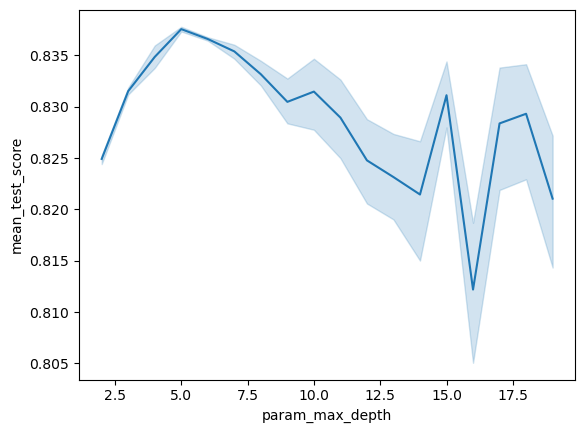

In [222]:
sns.lineplot(data=results, x="param_max_depth", y="mean_test_score")

<AxesSubplot:xlabel='param_min_samples_leaf', ylabel='mean_test_score'>

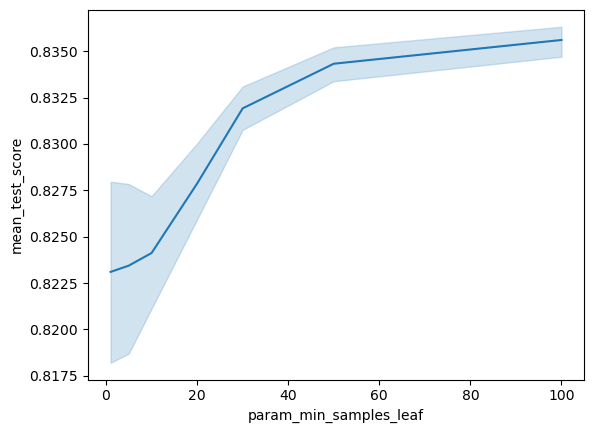

In [223]:
sns.lineplot(data=results, x="param_min_samples_leaf", y="mean_test_score")

In [224]:
zipped = zip(attributes, clf.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

energy 0.86914431691046
danceability 0.035205807489854794
duration_ms 0.026348492263884096
valence 0.025265879355761522
genres_val 0.017640519469826522
loudness 0.0055968446723754
n_beats 0.004757603902610233
speechiness 0.004646914074080963
instrumentalness 0.004186740277242279
liveness 0.0037907638550144663
tempo 0.0028740776166373085
n_bars 0.0005420401122523113
key 0.0
mode 0.0
time_signature 0.0
processing 0.0
explicit_val 0.0


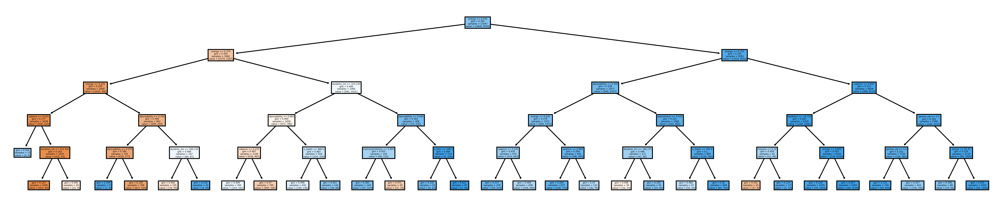

In [225]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(clf, feature_names=attributes, filled=True)
plt.show()

## #Acousticness wo

In [226]:
X_train=df_acousticness_train_wo.drop(["acousticness_map"], axis=1)
y_train=np.array(df_acousticness_train_wo['acousticness_map'])

X_test=df_acousticness_test_wo.drop(["acousticness_map"], axis=1)
y_test=np.array(df_acousticness_test_wo['acousticness_map'])

attributes = [col for col in df_acousticness_train_wo.columns if col != 'acousticness_map']

In [227]:
%%time
param_list = {
    'max_depth': [None] + list(np.arange(2, 20)),
    'min_samples_split': [2, 5, 10, 20, 30, 50, 100],
    'min_samples_leaf': [1, 5, 10, 20, 30, 50, 100],
    'criterion': ['gini', 'entropy']
}

clf = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)

random_search = RandomizedSearchCV(
    DecisionTreeClassifier(),
    param_distributions=param_list,
    cv=RepeatedStratifiedKFold(random_state=0),
    n_jobs=-1,
    refit=True,
    n_iter=200,
    #verbose=2
)

random_search.fit(X_train, y_train)
clf = random_search.best_estimator_

Wall time: 1min 30s


In [228]:
print(random_search.best_params_, random_search.best_score_)

{'min_samples_split': 30, 'min_samples_leaf': 50, 'max_depth': 6, 'criterion': 'entropy'} 0.8104376609879057


In [229]:
y_test_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_test_pred))

Accuracy: 0.8237986270022883


In [230]:
clf.score(X_test, y_test)

0.8237986270022883

In [231]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8167121872001181
Train F1-score [0.584296   0.88243928]

Test Accuracy 0.8237986270022883
Test F1-score [0.60875266 0.88629543]


In [232]:
print(classification_report(y_test, y_test_pred))

                precision    recall  f1-score   support

Molto acustico       0.74      0.51      0.61      3608
 Poco acustico       0.84      0.94      0.89      9939

      accuracy                           0.82     13547
     macro avg       0.79      0.73      0.75     13547
  weighted avg       0.82      0.82      0.81     13547



In [233]:
results = pd.DataFrame(random_search.cv_results_)

<AxesSubplot:xlabel='param_max_depth', ylabel='mean_test_score'>

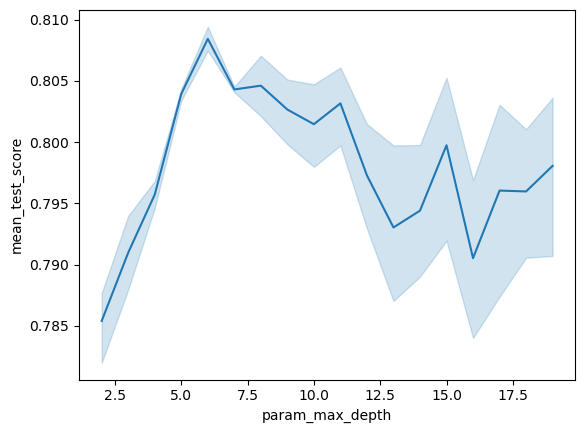

In [234]:
sns.lineplot(data=results, x="param_max_depth", y="mean_test_score")

<AxesSubplot:xlabel='param_min_samples_leaf', ylabel='mean_test_score'>

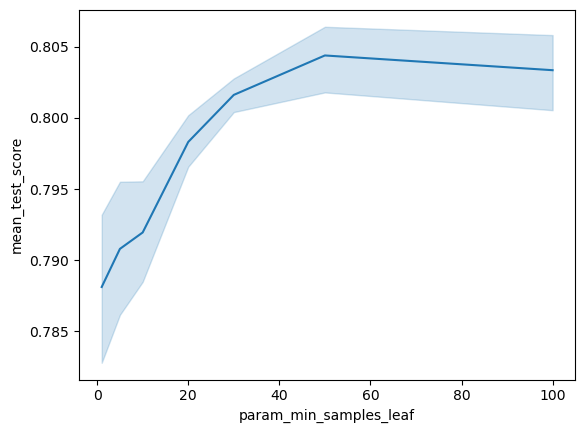

In [235]:
sns.lineplot(data=results, x="param_min_samples_leaf", y="mean_test_score")

In [236]:
zipped = zip(attributes, clf.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

loudness 0.5786656410929831
duration_ms 0.11679700249155972
speechiness 0.10696542457401155
instrumentalness 0.06506992859470458
n_beats 0.05213424634031587
valence 0.029602036693321943
liveness 0.020947154172753214
tempo 0.016407397690328757
n_bars 0.009881592270397518
mode 0.0035295760796237637
key 0.0
time_signature 0.0
processing 0.0
explicit_val 0.0


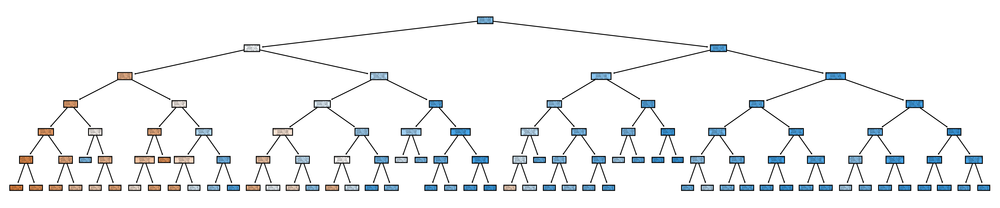

In [237]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(clf, feature_names=attributes, filled=True)
plt.show()

# ccp_alphas 

## #Energy full

In [332]:
X_train=df_energy_train.drop(["energy_map"], axis=1)
y_train=np.array(df_energy_train['energy_map'])

X_test=df_energy_test.drop(["energy_map"], axis=1)
y_test=np.array(df_energy_test['energy_map'])

attributes = [col for col in df_energy_train.columns if col != 'energy_map']

In [333]:
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

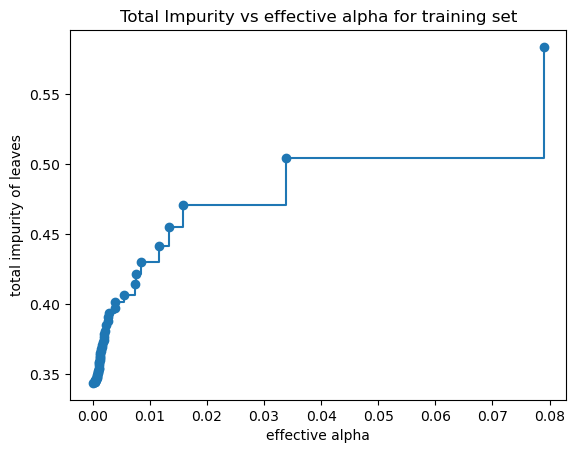

In [334]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [335]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha, **random_search.best_params_)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.24513947646183898


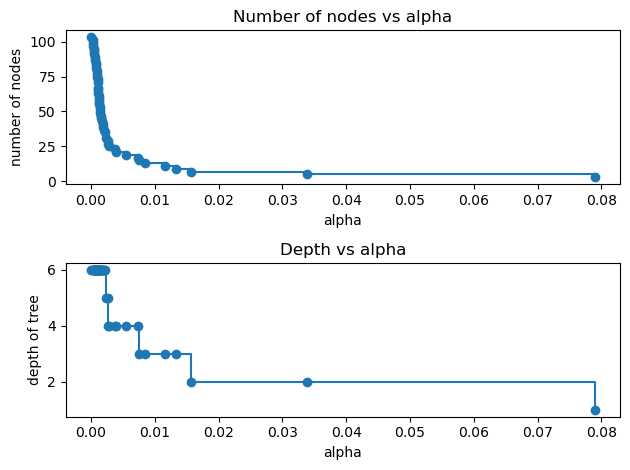

In [336]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

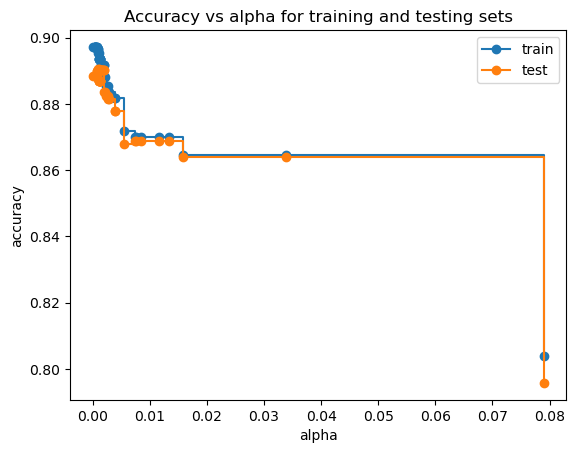

In [337]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [338]:
dtp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.006, min_samples_split=5, min_samples_leaf=30, max_depth=13, criterion="gini")
dtp.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.006, max_depth=13, min_samples_leaf=30,
                       min_samples_split=5, random_state=0)

In [339]:
y_test_pred = dtp.predict(X_test)

In [340]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.0
Train F1-score [0. 0. 0. 0.]

Test Accuracy 0.8761651131824234
Test F1-score [0.91674127 0.75844156]


In [341]:
print(classification_report(y_test, y_test_pred))

                  precision    recall  f1-score   support

Molto energetico       0.90      0.93      0.92      3296
 Poco energetico       0.80      0.72      0.76      1210

        accuracy                           0.88      4506
       macro avg       0.85      0.83      0.84      4506
    weighted avg       0.87      0.88      0.87      4506



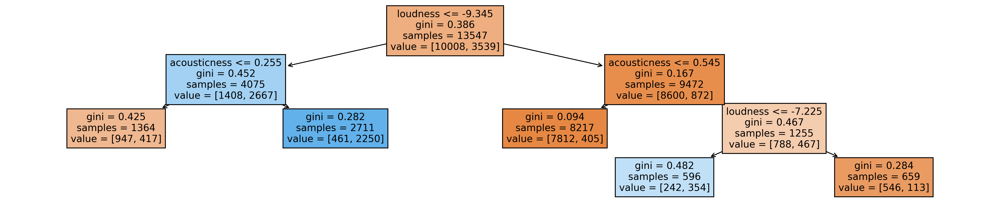

In [342]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dtp, feature_names=attributes, filled=True)
plt.show()

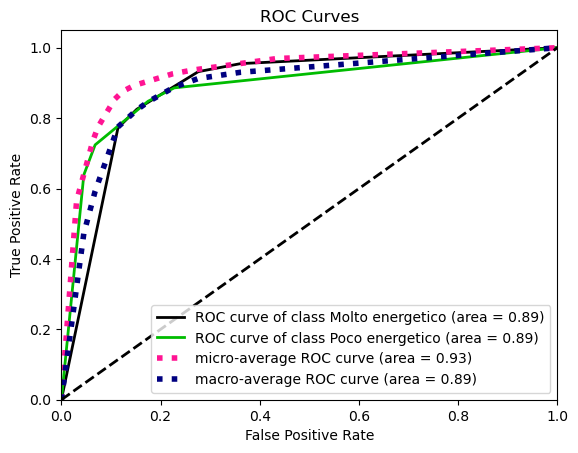

In [343]:
plot_roc(y_test, dtp.predict_proba(X_test))
plt.show()

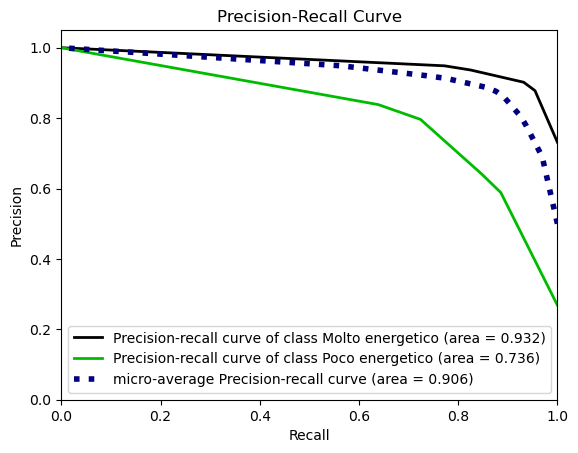

In [344]:
plot_precision_recall(y_test, dtp.predict_proba(X_test))
plt.show()

## #Energy wo

In [345]:
X_train=df_energy_train_wo.drop(["energy_map"], axis=1)
y_train=np.array(df_energy_train_wo['energy_map'])

X_test=df_energy_test_wo.drop(["energy_map"], axis=1)
y_test=np.array(df_energy_test_wo['energy_map'])

attributes = [col for col in df_energy_train_wo.columns if col != 'energy_map']

In [346]:
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

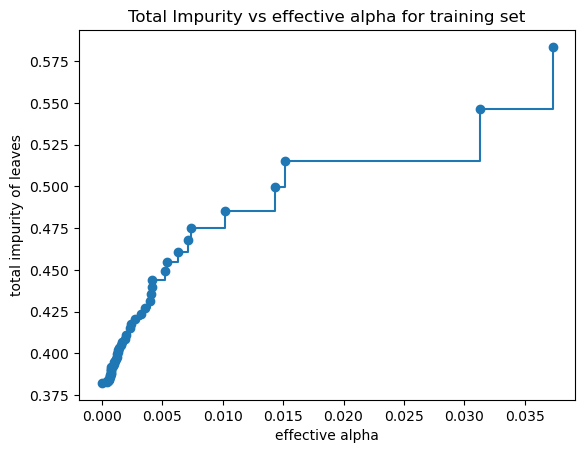

In [347]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [348]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha, **random_search.best_params_)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.24513947646183887


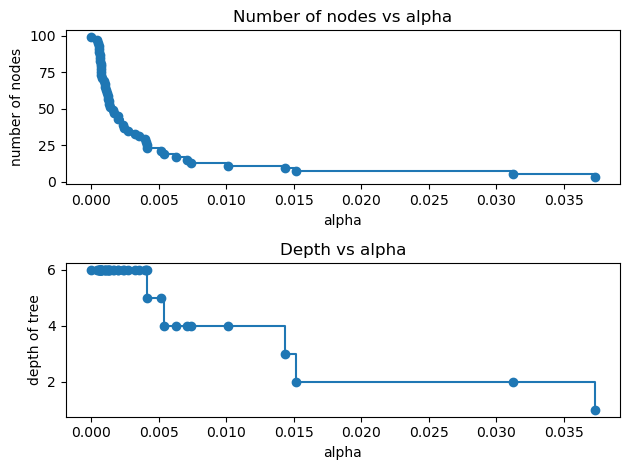

In [349]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

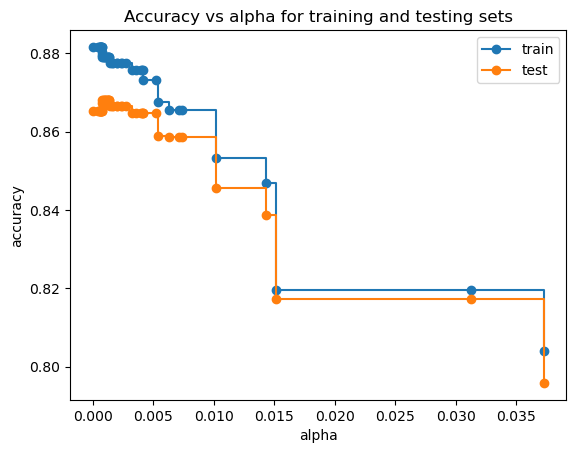

In [350]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [351]:
dtp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.006, min_samples_split=20, min_samples_leaf=50, max_depth=8, criterion="gini")
dtp.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.006, max_depth=8, min_samples_leaf=50,
                       min_samples_split=20, random_state=0)

In [352]:
y_test_pred = dtp.predict(X_test)

In [353]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.0
Train F1-score [0. 0. 0. 0.]

Test Accuracy 0.8577452285841101
Test F1-score [0.90336198 0.73055906]


In [354]:
print(classification_report(y_test, y_test_pred))

                  precision    recall  f1-score   support

Molto energetico       0.90      0.91      0.90      3296
 Poco energetico       0.74      0.72      0.73      1210

        accuracy                           0.86      4506
       macro avg       0.82      0.81      0.82      4506
    weighted avg       0.86      0.86      0.86      4506



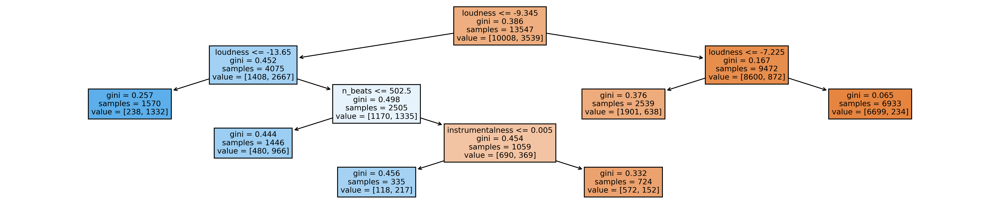

In [355]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dtp, feature_names=attributes, filled=True)
plt.show()

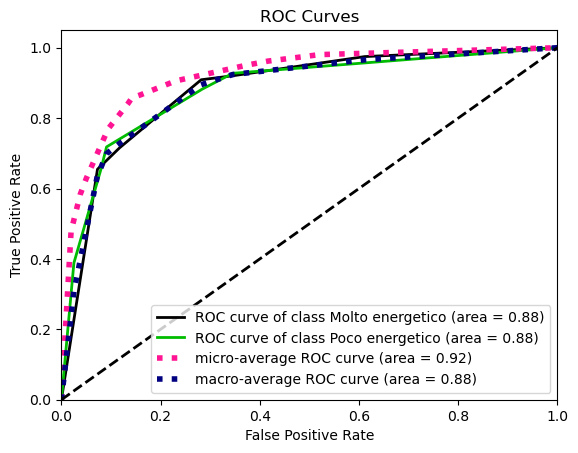

In [356]:
plot_roc(y_test, dtp.predict_proba(X_test))
plt.show()

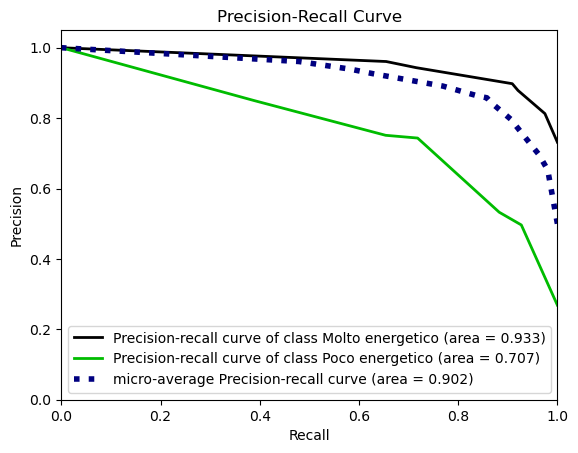

In [357]:
plot_precision_recall(y_test, dtp.predict_proba(X_test))
plt.show()

## #Danceability full

In [358]:
X_train=df_danceability_train.drop(["danceability_map"], axis=1)
y_train=np.array(df_danceability_train['danceability_map'])

X_test=df_danceability_test.drop(["danceability_map"], axis=1)
y_test=np.array(df_danceability_test['danceability_map'])

attributes = [col for col in df_danceability_train.columns if col != 'danceability_map']

In [359]:
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

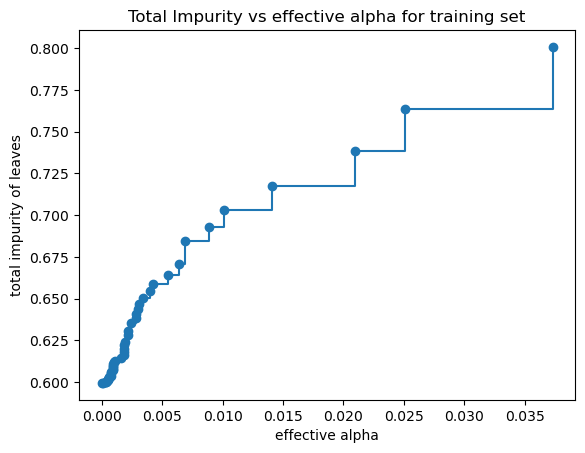

In [360]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [361]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha, **random_search.best_params_)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.1063549149297841


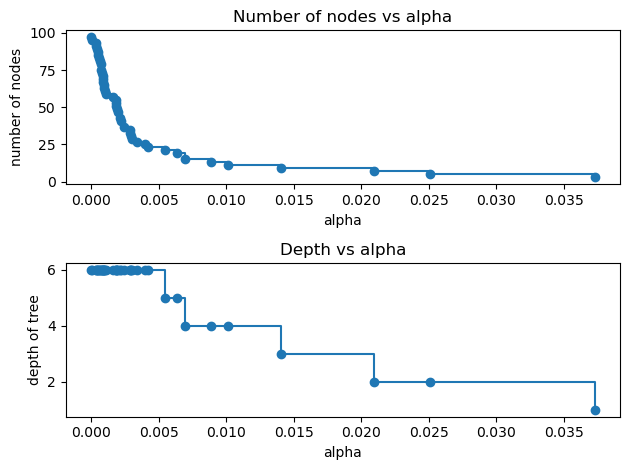

In [362]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

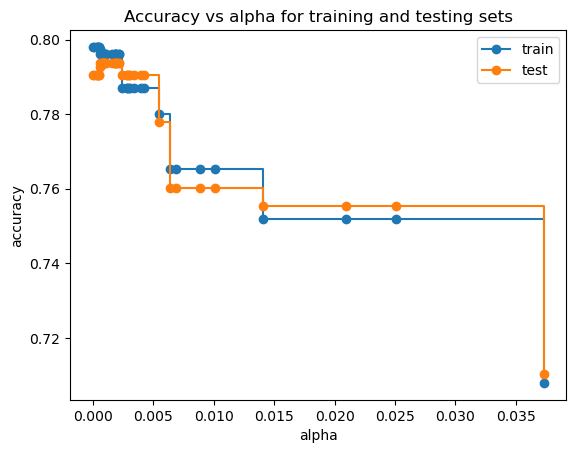

In [363]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [364]:
dtp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.006, min_samples_split=5, min_samples_leaf=50, max_depth=12, criterion="gini")
dtp.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.006, max_depth=12, min_samples_leaf=50,
                       min_samples_split=5, random_state=0)

In [365]:
y_test_pred = dtp.predict(X_test)

In [366]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.0
Train F1-score [0. 0. 0. 0.]

Test Accuracy 0.7691966267199289
Test F1-score [0.84701383 0.53026197]


In [367]:
print(classification_report(y_test, y_test_pred))

                 precision    recall  f1-score   support

Molto danzabile       0.77      0.95      0.85      3039
 Poco danzabile       0.79      0.40      0.53      1467

       accuracy                           0.77      4506
      macro avg       0.78      0.67      0.69      4506
   weighted avg       0.77      0.77      0.74      4506



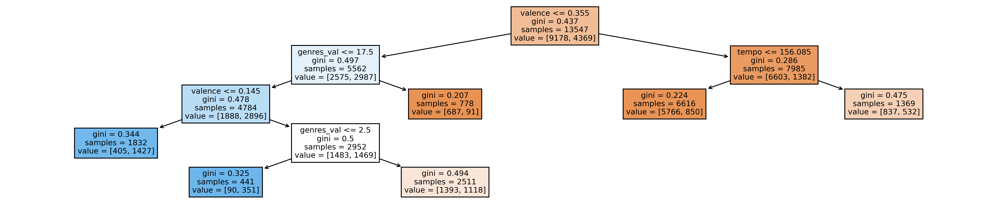

In [368]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dtp, feature_names=attributes, filled=True)
plt.show()

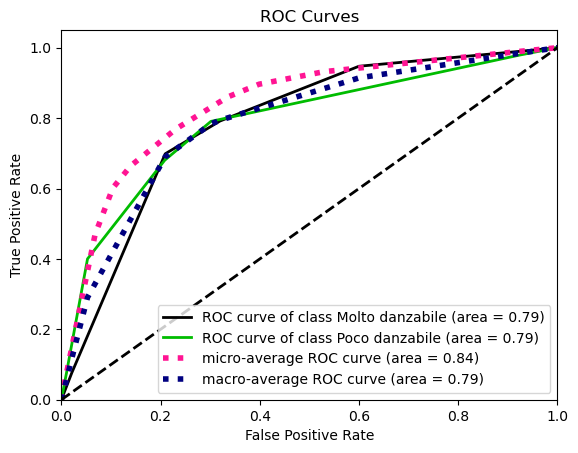

In [369]:
plot_roc(y_test, dtp.predict_proba(X_test))
plt.show()

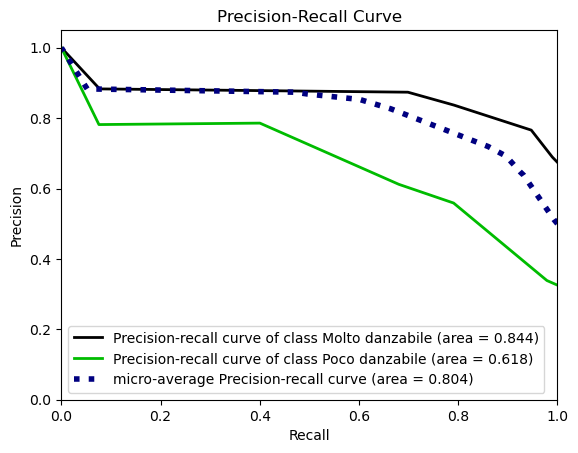

In [370]:
plot_precision_recall(y_test, dtp.predict_proba(X_test))
plt.show()

## #Danceability wo

In [371]:
X_train=df_danceability_train_wo.drop(["danceability_map"], axis=1)
y_train=np.array(df_danceability_train_wo['danceability_map'])

X_test=df_danceability_test_wo.drop(["danceability_map"], axis=1)
y_test=np.array(df_danceability_test_wo['danceability_map'])

attributes = [col for col in df_danceability_train_wo.columns if col != 'danceability_map']

In [372]:
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

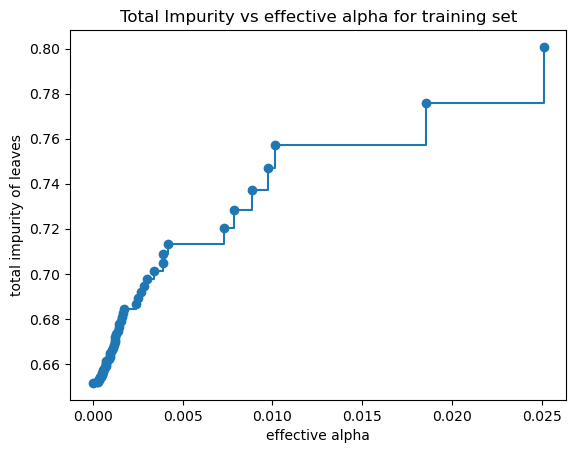

In [373]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [374]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha, **random_search.best_params_)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.10635491492978366


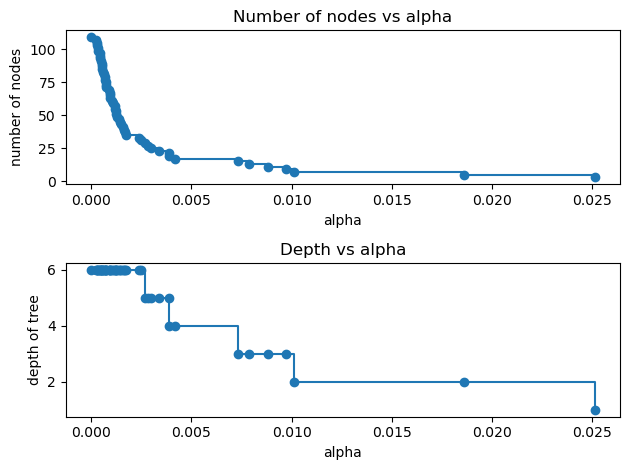

In [375]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

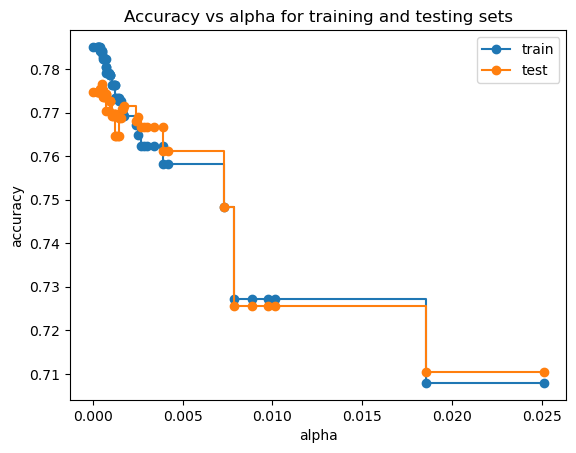

In [376]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [377]:
dtp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.006, min_samples_split=100, min_samples_leaf=20, max_depth=9, criterion="gini")
dtp.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.006, max_depth=9, min_samples_leaf=20,
                       min_samples_split=100, random_state=0)

In [378]:
y_test_pred = dtp.predict(X_test)

In [379]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.0
Train F1-score [0. 0. 0. 0.]

Test Accuracy 0.7254771415889925
Test F1-score [0.82594625 0.35065617]


In [380]:
print(classification_report(y_test, y_test_pred))

                 precision    recall  f1-score   support

Molto danzabile       0.72      0.97      0.83      3039
 Poco danzabile       0.76      0.23      0.35      1467

       accuracy                           0.73      4506
      macro avg       0.74      0.60      0.59      4506
   weighted avg       0.73      0.73      0.67      4506



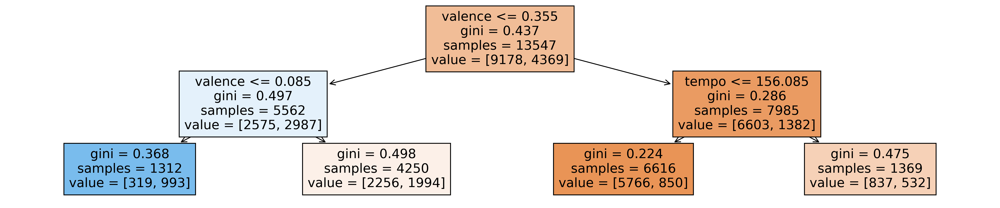

In [381]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dtp, feature_names=attributes, filled=True)
plt.show()

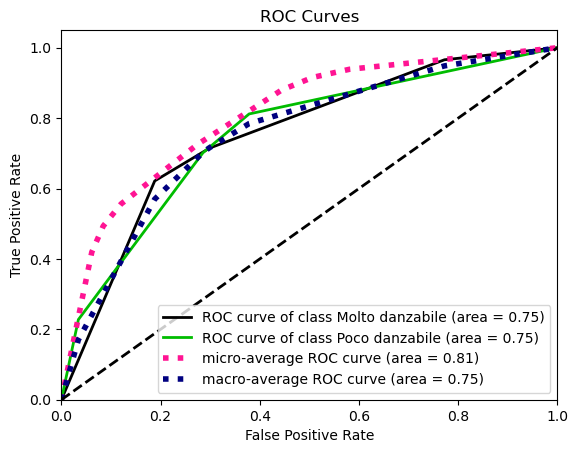

In [382]:
plot_roc(y_test, dtp.predict_proba(X_test))
plt.show()

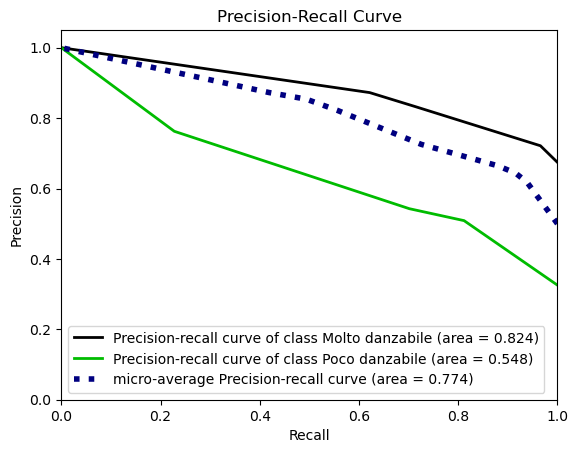

In [383]:
plot_precision_recall(y_test, dtp.predict_proba(X_test))
plt.show()

## #Acousticness full

In [384]:
X_train=df_acousticness_train.drop(["acousticness_map"], axis=1)
y_train=np.array(df_acousticness_train['acousticness_map'])

X_test=df_acousticness_test.drop(["acousticness_map"], axis=1)
y_test=np.array(df_acousticness_test['acousticness_map'])

attributes = [col for col in df_acousticness_train.columns if col != 'acousticness_map']

In [385]:
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

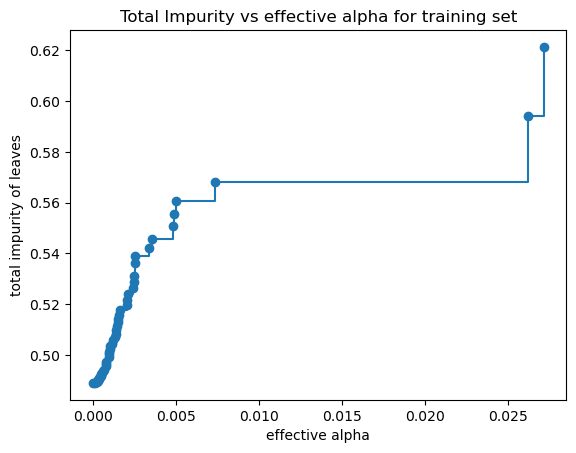

In [386]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [387]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha, **random_search.best_params_)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.21478864049951152


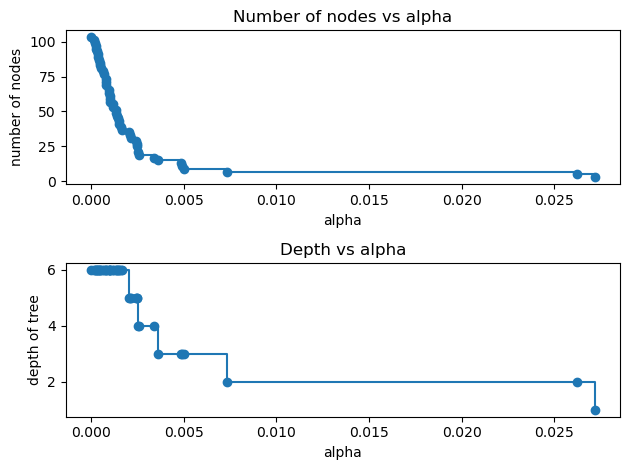

In [388]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

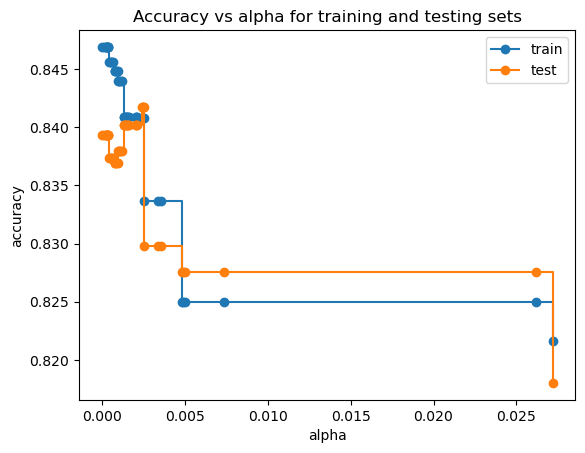

In [389]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [390]:
dtp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.006, min_samples_split=20, min_samples_leaf=5, max_depth=5, criterion="gini")
dtp.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.006, max_depth=5, min_samples_leaf=5,
                       min_samples_split=20, random_state=0)

In [391]:
y_test_pred = dtp.predict(X_test)

In [392]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8167121872001181
Train F1-score [0.584296   0.88243928]

Test Accuracy 0.8308921438082557
Test F1-score [0.61280488 0.89182283]


In [393]:
print(classification_report(y_test, y_test_pred))

                precision    recall  f1-score   support

Molto acustico       0.84      0.48      0.61      1247
 Poco acustico       0.83      0.96      0.89      3259

      accuracy                           0.83      4506
     macro avg       0.83      0.72      0.75      4506
  weighted avg       0.83      0.83      0.81      4506



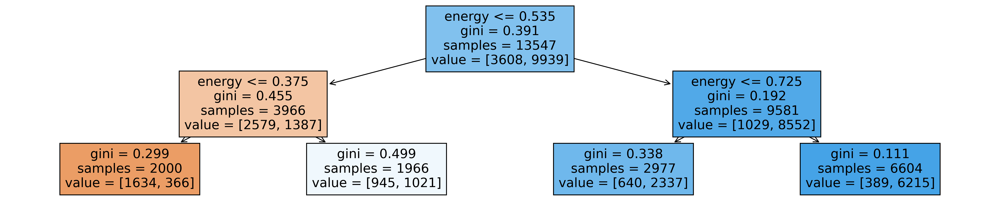

In [394]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dtp, feature_names=attributes, filled=True)
plt.show()

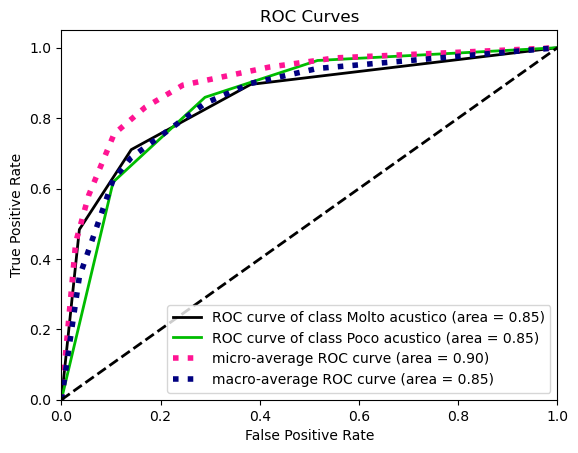

In [395]:
plot_roc(y_test, dtp.predict_proba(X_test))
plt.show()

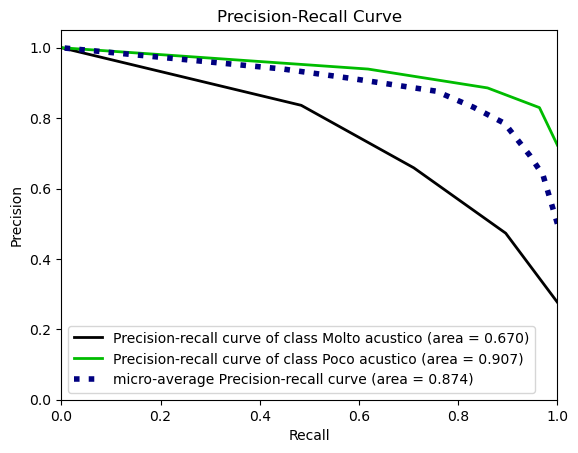

In [396]:
plot_precision_recall(y_test, dtp.predict_proba(X_test))
plt.show()

## #Acousticness wo

In [397]:
X_train=df_acousticness_train_wo.drop(["acousticness_map"], axis=1)
y_train=np.array(df_acousticness_train_wo['acousticness_map'])

X_test=df_acousticness_test_wo.drop(["acousticness_map"], axis=1)
y_test=np.array(df_acousticness_test_wo['acousticness_map'])

attributes = [col for col in df_acousticness_train_wo.columns if col != 'acousticness_map']

In [398]:
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

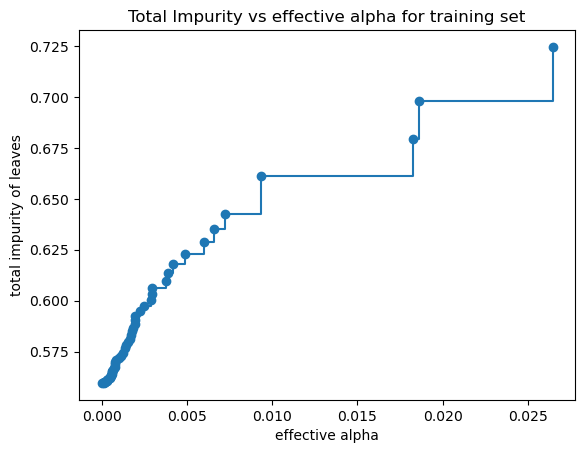

In [399]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [400]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha, min_samples_split=30, min_samples_leaf=50, max_depth=6, criterion="entropy")
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.11149573613919805


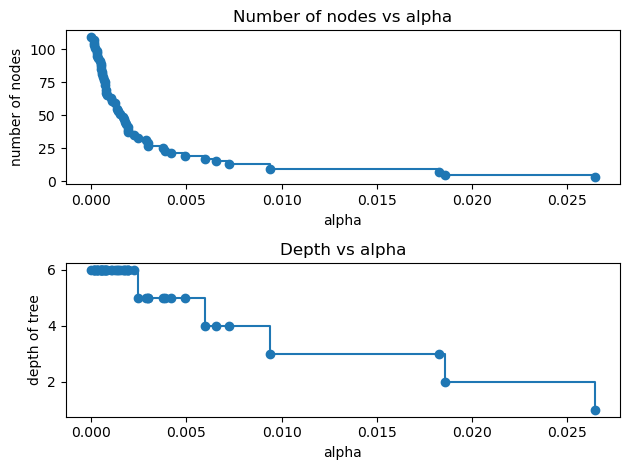

In [401]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

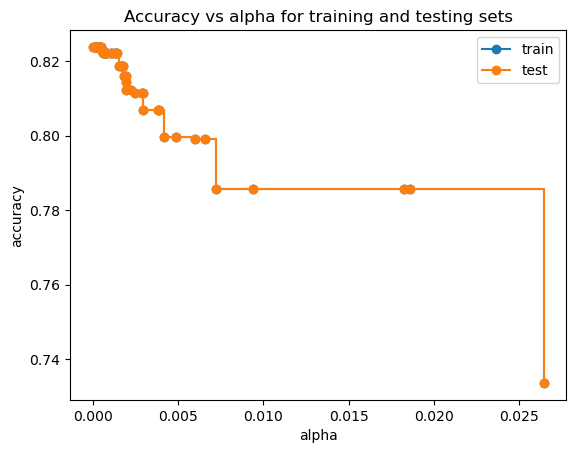

In [402]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [403]:
dtp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.006, **random_search.best_params_)
dtp.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.006, criterion='entropy', max_depth=6,
                       min_samples_leaf=50, min_samples_split=30,
                       random_state=0)

In [404]:
y_test_pred = dtp.predict(X_test)

In [405]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8167121872001181
Train F1-score [0.584296   0.88243928]

Test Accuracy 0.7990699047759652
Test F1-score [0.59721811 0.8661487 ]


In [406]:
print(classification_report(y_test, y_test_pred))

                precision    recall  f1-score   support

Molto acustico       0.64      0.56      0.60      3608
 Poco acustico       0.85      0.89      0.87      9939

      accuracy                           0.80     13547
     macro avg       0.74      0.72      0.73     13547
  weighted avg       0.79      0.80      0.79     13547



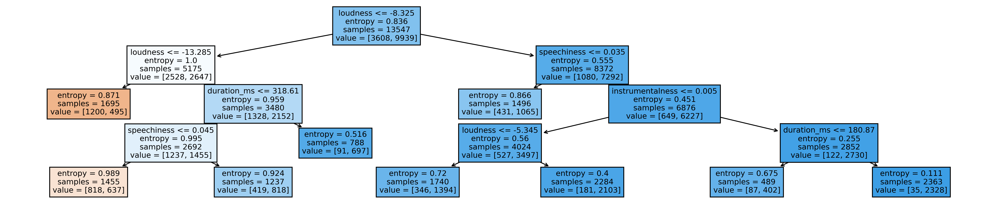

In [407]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dtp, feature_names=attributes, filled=True)
plt.show()

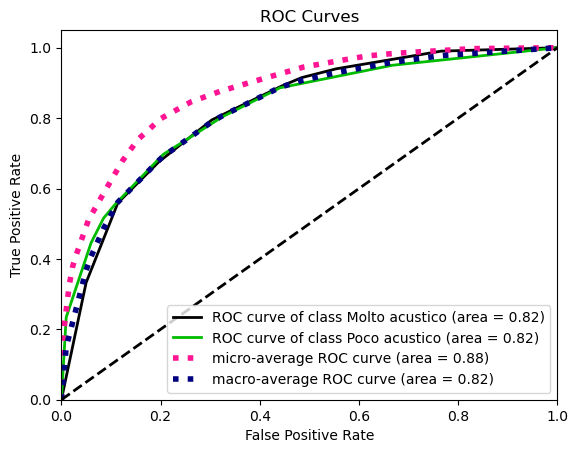

In [408]:
plot_roc(y_test, dtp.predict_proba(X_test))
plt.show()

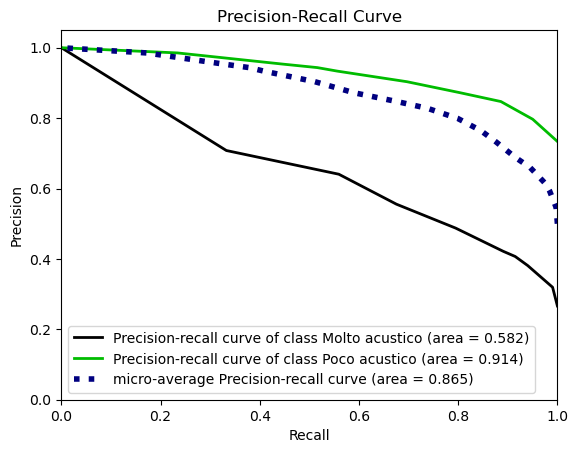

In [409]:
plot_precision_recall(y_test, dtp.predict_proba(X_test))
plt.show()